In [146]:
import numpy as np
import pandas as pd
import datetime
import operator
df = pd.read_csv('C:\\Vimal Anand\\loads_final.csv', parse_dates=["collection_date","delivery_date"])
#df = df[df.collection_longitude < -1.5]
#df = df[df.collection_longitude > -3.5]
#df = df[df.collection_latitude < 60]
#df = df[df.collection_latitude > 55]
#df = df[:100]
#df = df[df.collection_date > ('2015-10-06 11:00:00')]
X = np.array(list(zip(df['collection_longitude'], df['collection_latitude'])))
df

,collection_longitude,collection_latitude,collection_date,delivery_longitude,delivery_latitude,delivery_date,size,id
0,-2.214219,57.239806,2016-10-06 11:00:00,-2.080793,57.140803,2016-10-06 13:00:00,1.000000,1006262
1,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
2,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
3,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
4,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
5,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
6,-2.081943,57.127896,2017-01-15 08:30:00,-2.081300,57.143050,2017-01-15 14:00:00,0.166667,1019653
7,-2.068563,57.139872,2016-12-29 14:00:00,-2.072161,57.142733,2016-12-29 16:00:00,1.000000,1017754
8,-2.417496,57.114156,2016-12-28 11:30:00,-2.081300,57.143050,2016-12-28 14:00:00,0.333333,1017570
9,-2.417496,57.114156,2016-12-28 11:30:00,-2.081300,57.143050,2016-12-28 14:00:00,0.333333,1017570


In [41]:
from sklearn.cluster import KMeans, MiniBatchKMeans
def k_means(X, n):
    # kmeans = KMeans(n_clusters=n)
    mbk = MiniBatchKMeans(n_clusters=n, batch_size=10000)
    # kmeans = kmeans.fit(X)
    mbk = mbk.fit(X)
    # labels = kmeans.predict(X)
    labels = mbk.predict(X)
    # C = kmeans.cluster_centers_
    C = mbk.cluster_centers_
    return C, mbk

centr, mb = k_means(X, 21)
d = {i: X[np.where(mb.labels_ == i)] for i in range(mb.n_clusters)}
d1 = {i: np.where(mb.labels_ == i)[0] for i in range(mb.n_clusters)}
# print(centr)
# print(d)
# print(d1)
import seaborn as sns
import matplotlib.pyplot as plt
k = d.keys()
v = list(d.values())
vids = list(d1.values())


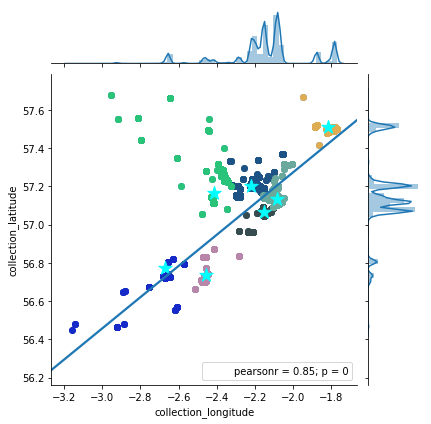

In [19]:
from random import randint
def ret_col():
    hello= ["1","2","3","4","5","6","7","8","9","a","b","c","e","d","f"]
    v="#"
    count=0
    for i in range(0,len(hello)):
        v=v+str(hello[randint(0,14)])
        count+=1
        if(count==6):
            #print(v)
            break
    return v

plt1 = sns.jointplot(x='collection_longitude', y='collection_latitude', data=df, kind='reg')
# col = ['yellow', 'green', 'red', 'blue', 'maroon', 'grey', 'black']
# col = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71", "#0000ff", 'yellow', 'green', 'red', 'blue', 'maroon', 'grey', 'black']
for i in range(0, len(v)):
    plt1.ax_joint.scatter(v[i][:, 0], v[i][:, 1], color = ret_col())
plt.scatter(centr[:, 0], centr[:, 1], marker='*', s=200, c='aqua')

In [47]:
date_time11 = []
date_time21 = []
date_time31 = []
geo_loc =[]
for i in range(0, len(vids)):
    date_time1 = {}
    date_time2 = {}
    date_time3 = {}
    geo_loc1 = []
   # print(len(vids))
    for j in range(0, len(vids[i])):
        date_time1.update({vids[i][j]: [df['collection_longitude'].iloc[vids[i][j]], df['collection_latitude'].iloc[vids[i][j]]]})
        date_time2.update({vids[i][j]: df['collection_date'].iloc[vids[i][j]]})
        date_time3.update({vids[i][j]: [df['collection_date'].iloc[vids[i][j]], df['size'].iloc[vids[i][j]]]})
        geo_loc1.append(df['collection_longitude'].iloc[vids[i][j]])
        geo_loc1.append(df['collection_latitude'].iloc[vids[i][j]])
        geo_loc1.append(df['delivery_longitude'].iloc[vids[i][j]])
        geo_loc1.append(df['delivery_latitude'].iloc[vids[i][j]])
       # geo_loc1.append(df['collection_longitude'].iloc[vids[i][j]])
        #date_time1.append(df['collection_date'].iloc[vids[i][j]])
    date_time11.append(date_time1)
    date_time21.append(date_time2)
    date_time31.append(date_time3)
    geo_loc.append(geo_loc1)
# date_time
date_time_sorted1 = []
date_time_sorted2 = []
date_time_sorted3 = []
geo_loc_sorted=[]
for diction in date_time11:
    sorted_x = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted1.append(sorted_x)
for diction in date_time21:
    sorted_y = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted2.append(sorted_y)
for diction in date_time31:
    sorted_z = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted3.append(sorted_z)

[(20171, [Timestamp('2016-08-19 08:00:00'), 0.25]),
 (20172, [Timestamp('2016-08-19 08:00:00'), 0.25]),
 (20173, [Timestamp('2016-08-19 08:00:00'), 0.25]),
 (20174, [Timestamp('2016-08-19 08:00:00'), 0.25]),
 (8300, [Timestamp('2016-08-19 12:00:00'), 0.5]),
 (8301, [Timestamp('2016-08-19 12:00:00'), 0.5]),
 (9541, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (9542, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (9543, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (9544, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (9545, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (15189, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (15190, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (15191, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (15192, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (15193, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (18847, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (18848, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (18849, [Timestamp('2016-08-19 14:00:00'), 0.6]),
 (18850, [Timestamp('2016-08-19 14

In [52]:
b

[[(Timestamp('2016-08-19 08:00:00'), [0.25, 0.25, 0.25, 0.25]),
  (Timestamp('2016-08-19 12:00:00'), [0.5, 0.5]),
  (Timestamp('2016-08-19 14:00:00'),
   [0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6,
    0.6]),
  (Timestamp('2016-08-20 07:00:00'),
   [0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.125,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869565,
    0.3043478260869

In [108]:
c=[]
b=[]
for i in date_time_sorted3:
    e={}
    for j in i:
        key = j[1][0]
       # print(key)
        if key not in e:
               e[key]=[]
        e[key].append([j[1][1],j[0]])
    c.append(e)
#c
for diction in c:
    sorted_x = sorted(diction.items(), key=operator.itemgetter(0))
    #print(len(sorted_x))
    b.append(sorted_x)
print(b[0][0][1][0][0])
print(len(b[0][0][1]))

0.25
4


In [172]:
g=[]
j=[]
for i in range(0,len(date_time_sorted3)):
    for j in range(0,len(b[i])):
        s=[]
        v=[]
        for k in range(0,len(b[i][j][1])):
            s.append(b[i][j][1][k][1])
        g.append(s)
    
                     
            

#len(g)
#g
#len(g)
len(g)
g

[[20171, 20172, 20173, 20174],
 [8300, 8301],
 [9541,
  9542,
  9543,
  9544,
  9545,
  15189,
  15190,
  15191,
  15192,
  15193,
  18847,
  18848,
  18849,
  18850,
  18851],
 [20261,
  20262,
  20263,
  20264,
  20265,
  20266,
  20267,
  20268,
  20269,
  20270,
  20271,
  20272,
  20273,
  20274,
  20275,
  20276,
  9880,
  9881,
  9882,
  9883,
  9884,
  9885,
  9886,
  9887,
  9888,
  9889,
  9890,
  9891,
  9892,
  9893,
  9894,
  9895,
  9896,
  9897,
  9898,
  9899,
  9900,
  9901,
  9902,
  9903,
  9904,
  9905,
  9906,
  9907,
  9908,
  9909,
  9910,
  9911,
  9912,
  9913,
  9914,
  9915,
  9916,
  9917,
  9918,
  9919,
  9920,
  9921,
  9922,
  9923,
  9924,
  9925,
  19453,
  19454,
  19455,
  19456,
  19457,
  19458,
  19459,
  19460,
  19461,
  19462,
  19463,
  19464,
  19465,
  19466,
  19467,
  19468,
  19469,
  19470,
  19471,
  19472,
  19473,
  19474,
  19475,
  19476,
  19477,
  19478,
  19479,
  19480,
  19481,
  19482,
  19483,
  19484,
  19485,
  19486,
  194

In [173]:
class Bin():
    def __init__(self,ids,item):
        self.items = []
        self.attr=[]
        self.sum = 0
        self.idv = ids
        self.loc=df['collection_date'].iloc[item]

    def append(self, item):
        #self.attr.append([df['collection_longitude'].iloc[item],df['collection_latitude'].iloc[item],df['collection_date'].iloc[item]])
        self.items.append([df['size'].iloc[item],df['collection_longitude'].iloc[item],df['collection_latitude'].iloc[item]])
        self.sum += df['size'].iloc[item]

    def __str__(self):
        return 'geotime_cluster= %s and Item is collected by= "%s"\n(items=%s)\n' %(str(self.idv),str(self.loc),str(self.items))


def pack(values, maxValue,ids):
    #values = sorted(values, reverse=True)
    bins = []

    for item in values:
        # Try to fit item into a bin
        for bin in bins:
            if bin.sum + df['size'].iloc[item] <= maxValue:
                #print 'Adding', item, 'to', bin
                bin.append(item)
                break
        else:
            # item didn't fit into any bin, start a new bin
            #print 'Making new bin for', item
            bin = Bin(ids,item)
            bin.append(item)
            bins.append(bin)

    return bins


if __name__ == '__main__':
    import random

    def packAndShow(aList, maxValue,ids):
        """ Pack a list into bins and show the result """
        #print ('List with sum', sum(aList), 'requires at least', (sum(aList)+maxValue-1)/maxValue, 'bins'0

        bins = pack(aList, maxValue,ids)

        print ('Total', len(bins), 'Trucks:')
        for bin in bins:
            print (bin)

        print ('\n')
        return len(bins)


    #aList = [10,9,8,7,6,5,4,3,2,1]
    #packAndShow(aList, 11)

    #aList = [ random.randint(1, 11) for i in range(100) ]
    #packAndShow(aList, 11)  

n=0
for i in range(0,len(g)):
    aList= g[i]
    n+=packAndShow(aList,1,i)


Total 1 Trucks:
geotime_cluster= 0 and Item is collected by= "2016-08-19 08:00:00"
(items=[[0.25, -2.148702700000058, 57.068941], [0.25, -2.148702700000058, 57.068941], [0.25, -2.148702700000058, 57.068941], [0.25, -2.148702700000058, 57.068941]])



Total 1 Trucks:
geotime_cluster= 1 and Item is collected by= "2016-08-19 12:00:00"
(items=[[0.5, -2.156868700000018, 57.06957779999999], [0.5, -2.156868700000018, 57.06957779999999]])



Total 15 Trucks:
geotime_cluster= 2 and Item is collected by= "2016-08-19 14:00:00"
(items=[[0.6, -2.155864000000065, 57.067443]])

geotime_cluster= 2 and Item is collected by= "2016-08-19 14:00:00"
(items=[[0.6, -2.155864000000065, 57.067443]])

geotime_cluster= 2 and Item is collected by= "2016-08-19 14:00:00"
(items=[[0.6, -2.155864000000065, 57.067443]])

geotime_cluster= 2 and Item is collected by= "2016-08-19 14:00:00"
(items=[[0.6, -2.155864000000065, 57.067443]])

geotime_cluster= 2 and Item is collected by= "2016-08-19 14:00:00"
(items=[[0.6, -2.1

Total 65 Trucks:
geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-29 10:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 29 and Item is collected by= "2016-08-

Total 81 Trucks:
geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= "2016-10-21 12:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 130 and Item is collected by= 

Total 72 Trucks:
geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 08:00:00"
(items=[[0.5833333333333334, -2.148702700000058, 57.068941]])

geotime_cluster= 167 and Item is collected by= "2016-11-05 

Total 49 Trucks:
geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= "2016-11-26 08:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 221 and Item is collected by= 

Total 21 Trucks:
geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.3333333333333333, -2.162111900000013, 57.0693016], [0.3333333333333333, -2.162111900000013, 57.0693016], [0.3333333333333333, -2.162111900000013, 57.0693016]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collected by= "2016-12-28 08:00:00"
(items=[[0.8, -2.148702700000058, 57.068941]])

geotime_cluster= 303 and Item is collect

Total 121 Trucks:
geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by= "2017-01-27 13:00:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 361 and Item is collected by=

Total 88 Trucks:
geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.1496081352233887, 57.07027637113306]])

geotime_cluster= 401 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.149608135223388

Total 4 Trucks:
geotime_cluster= 456 and Item is collected by= "2017-03-03 07:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 456 and Item is collected by= "2017-03-03 07:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 456 and Item is collected by= "2017-03-03 07:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 456 and Item is collected by= "2017-03-03 07:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])



Total 1 Trucks:
geotime_cluster= 457 and Item is collected by= "2017-03-03 07:30:00"
(items=[[0.5, -2.12921142574487, 57.067845518710364], [0.5, -2.12921142574487, 57.067845518710364]])



Total 1 Trucks:
geotime_cluster= 458 and Item is collected by= "2017-03-03 10:00:00"
(items=[[1.0, -2.12921142574487, 57.067845518710364]])



Total 32 Trucks:
geotime_cluster= 459 and Item is collected by= "2017-03-03 11:01:00"
(items=[[0.3157894736842105, -2.162111900000013, 57.0693016]


geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:30:00"
(items=[[1.0, -2.148702700000058, 57.068941]])

geotime_cluster= 490 and Item is collected by= "2017-03-15 14:3

Total 83 Trucks:
geotime_cluster= 517 and Item is collected by= "2017-03-27 09:00:00"
(items=[[0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 517 and Item is collected by= "2017-03-27 09:00:00"
(items=[[0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 517 and Item is collected by= "2017-03-27 09:00:00"
(items=[[0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 517 and Item is collected by= "2017-03-27 09:00:00"
(items=[[0.3181818181818182, -2.116508483522921, 57.07966308260464], [0.3181818181818182, -2.116508483522921, 57.07966308260464]

Total 116 Trucks:
geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 529 and Item is collected by= "2017-03-29 12:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 529 and Item is collected 

Total 289 Trucks:
geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 557 and Item is collected by= "2017-04-11 08:01:00"
(items=[[1.0, -2.14974761009216

Total 14 Trucks:
geotime_cluster= 586 and Item is collected by= "2017-04-26 07:00:00"
(items=[[0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016]])

geotime_cluster= 586 and Item is collected by= "2017-04-26 07:00:00"
(items=[[0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016]])

geotime_cluster= 586 and Item is collected by= "2017-04-26 07:00:00"
(items=[[0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016]])

geotime_cluster= 586 and Item is collected by= "2017-04-26 07:00:00"
(items=[[0.2727272727272727, -2.162111900000013, 57.0693016], [0.2727272727272727, -2.162111900000013, 57.0693016], [0.3, -2.162111900000013, 57.0693016]])

geotime_cluster= 586 and Item is c

Total 105 Trucks:
geotime_cluster= 609 and Item is collected by= "2017-05-08 08:30:00"
(items=[[0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 609 and Item is collected by= "2017-05-08 08:30:00"
(items=[[0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 609 and Item is collected by= "2017-05-08 08:30:00"
(items=[[0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 609 and Item is collected by= "2017-05-08 08:30:00"
(items=[[0.3181818181818182, -2.1534924000000046, 57.07107430000001], [0.3181818181818182, -2.1534924000000046, 57.071

Total 121 Trucks:
geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.06851497411448]])

geotime_cluster= 629 and Item is collected by= "2017-05-16 10:00:00"
(items=[[1.0, -2.156624794006348, 57.0

Total 100 Trucks:
geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.07966308260464]])

geotime_cluster= 670 and Item is collected by= "2017-06-06 12:00:00"
(items=[[1.0, -2.116508483522921, 57.0


geotime_cluster= 753 and Item is collected by= "2017-07-04 08:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 753 and Item is collected by= "2017-07-04 08:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])



Total 1 Trucks:
geotime_cluster= 754 and Item is collected by= "2017-07-04 08:01:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])



Total 1 Trucks:
geotime_cluster= 755 and Item is collected by= "2017-07-04 08:30:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])



Total 6 Trucks:
geotime_cluster= 756 and Item is collected by= "2017-07-04 09:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 756 and Item is collected by= "2017-07-04 09:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 756 and Item is collected by= "2017-07-04 09:00:00"
(items=[[0.6666666666666666, -2.162111900000013, 57.0693016]])

geotime_cluster= 756 and Ite

Total 19 Trucks:
geotime_cluster= 832 and Item is collected by= "2017-07-28 13:00:00"
(items=[[0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016]])

geotime_cluster= 832 and Item is collected by= "2017-07-28 13:00:00"
(items=[[0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016]])

geotime_cluster= 832 and Item is collected by= "2017-07-28 13:00:00"
(items=[[0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016]])

geotime_cluster= 832 and Item is collected by= "2017-07-28 13:00:00"
(items=[[0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016], [0.2857142857142857, -2.162111900000013, 57.0693016]])

geotime_cluster= 83

Total 96 Trucks:
geotime_cluster= 908 and Item is collected by= "2017-08-19 06:00:00"
(items=[[0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 908 and Item is collected by= "2017-08-19 06:00:00"
(items=[[0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 908 and Item is collected by= "2017-08-19 06:00:00"
(items=[[0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 908 and Item is collected by= "2017-08-19 06:00:00"
(items=[[0.2962962962962963, -2.1534924000000046, 57.07107430000001], [0.2962962962962963, -2.1534924000000046, 57.0710

Total 116 Trucks:
geotime_cluster= 930 and Item is collected by= "2017-08-24 11:00:00"
(items=[[0.3333333333333333, -2.1534924000000046, 57.07107430000001], [0.3333333333333333, -2.1534924000000046, 57.07107430000001], [0.3333333333333333, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 930 and Item is collected by= "2017-08-24 11:00:00"
(items=[[0.4782608695652174, -2.162111900000013, 57.0693016], [0.4782608695652174, -2.162111900000013, 57.0693016]])

geotime_cluster= 930 and Item is collected by= "2017-08-24 11:00:00"
(items=[[0.4782608695652174, -2.162111900000013, 57.0693016], [0.4782608695652174, -2.162111900000013, 57.0693016]])

geotime_cluster= 930 and Item is collected by= "2017-08-24 11:00:00"
(items=[[0.4782608695652174, -2.162111900000013, 57.0693016], [0.4782608695652174, -2.162111900000013, 57.0693016]])

geotime_cluster= 930 and Item is collected by= "2017-08-24 11:00:00"
(items=[[0.4782608695652174, -2.162111900000013, 57.0693016], [0.4782608695652174, -2.1

Total 82 Trucks:
geotime_cluster= 973 and Item is collected by= "2017-09-06 08:00:00"
(items=[[0.25, -2.1527382731437683, 57.04444194994832], [0.25, -2.1527382731437683, 57.04444194994832], [0.25, -2.1527382731437683, 57.04444194994832], [0.25, -2.1527382731437683, 57.04444194994832]])

geotime_cluster= 973 and Item is collected by= "2017-09-06 08:00:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 973 and Item is collected by= "2017-09-06 08:00:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 973 and Item is collected by= "2017-09-06 08:00:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 973 and Item is collected by= "2017-09-06 08:00:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 973

Total 190 Trucks:
geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1002 and Item is collected by= "2017-09-16 06:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.0710743

Total 11 Trucks:
geotime_cluster= 1039 and Item is collected by= "2017-10-03 08:00:00"
(items=[[0.42857142857142855, -2.1294679999999744, 57.06168100000001], [0.42857142857142855, -2.1294679999999744, 57.06168100000001]])

geotime_cluster= 1039 and Item is collected by= "2017-10-03 08:00:00"
(items=[[0.42857142857142855, -2.1294679999999744, 57.06168100000001], [0.42857142857142855, -2.1294679999999744, 57.06168100000001]])

geotime_cluster= 1039 and Item is collected by= "2017-10-03 08:00:00"
(items=[[0.42857142857142855, -2.1294679999999744, 57.06168100000001], [0.42857142857142855, -2.1294679999999744, 57.06168100000001]])

geotime_cluster= 1039 and Item is collected by= "2017-10-03 08:00:00"
(items=[[0.42857142857142855, -2.1294679999999744, 57.06168100000001], [0.42857142857142855, -2.1294679999999744, 57.06168100000001]])

geotime_cluster= 1039 and Item is collected by= "2017-10-03 08:00:00"
(items=[[0.42857142857142855, -2.1294679999999744, 57.06168100000001], [0.428571428571428

Total 136 Trucks:
geotime_cluster= 1156 and Item is collected by= "2017-11-28 11:00:00"
(items=[[0.3703703703703704, -2.1534924000000046, 57.07107430000001], [0.3703703703703704, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1156 and Item is collected by= "2017-11-28 11:00:00"
(items=[[0.3703703703703704, -2.1534924000000046, 57.07107430000001], [0.3703703703703704, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1156 and Item is collected by= "2017-11-28 11:00:00"
(items=[[0.3703703703703704, -2.1534924000000046, 57.07107430000001], [0.3703703703703704, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1156 and Item is collected by= "2017-11-28 11:00:00"
(items=[[0.3703703703703704, -2.1534924000000046, 57.07107430000001], [0.3703703703703704, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1156 and Item is collected by= "2017-11-28 11:00:00"
(items=[[0.3703703703703704, -2.1534924000000046, 57.07107430000001], [0.3703703703703704, -2.15




Total 23 Trucks:
geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1203 and Item is collected by= "2017-12-22 09:00:00"
(items=[[0.9090909090909092, -2.149747610092163, 57.070328

Total 67 Trucks:
geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725082397456, 57.07039301699059]])

geotime_cluster= 1255 and Item is collected by= "2018-01-18 09:00:00"
(items=[[1.0, -2.1496725

Total 16 Trucks:
geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107430000001], [0.5, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1317 and Item is collected by= "2018-02-21 11:01:00"
(items=[[0.5, -2.1534924000000046, 57.07107

Total 190 Trucks:
geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1360 and Item is collected by= "2018-03-09 11:00:00"
(items=[[0.5263157894736842, -2.1534924000000046, 57.0710743


geotime_cluster= 1421 and Item is collected by= "2018-03-31 08:30:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1421 and Item is collected by= "2018-03-31 08:30:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1421 and Item is collected by= "2018-03-31 08:30:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1421 and Item is collected by= "2018-03-31 08:30:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])



Total 8 Trucks:
geotime_cluster= 1422 and Item is collected by= "2018-04-01 05:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1422 and Item is collected by= "2018-04-01 05:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1422 and Item is collected by= "2018-04-01 05:00:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1422 and Item is collected by= "2018-04-01 05:00:00"
(items=[[1.0, -2.15349

Total 90 Trucks:
geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.156868700000018, 57.06957779999999]])

geotime_cluster= 1455 and Item is collected by= "2018-04-13 08:00:00"
(items=[[0.9, -2.15686870000001

Total 70 Trucks:
geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1490 and Item is collected by= "2018-04-26 10:00:00"
(items=[[1.0, -2.1497476

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.5, -2.1527382731437683, 57.04444194994832], [0.5, -2.1527382731437683, 57.04444194994832]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1538 and Item is collected by= "2018-05-10 07:00:00"
(items=[[0.6666666666666666, -2.15349240000000

Total 45 Trucks:
geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.4, -2.1527382731437683, 57.04444194994832], [0.4, -2.1527382731437683, 57.04444194994832]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.4, -2.1527382731437683, 57.04444194994832], [0.4, -2.1527382731437683, 57.04444194994832]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.4, -2.1527382731437683, 57.04444194994832]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.7857142857142857, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.7857142857142857, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.7857142857142857, -2.149747610092163, 57.070328861814325]])

geotime_cluster= 1559 and Item is collected by= "2018-05-17 10:00:00"
(items=[[0.7

Total 144 Trucks:
geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.1534924000000046, 57.07107430000001]])

geotime_cluster= 1562 and Item is collected by= "2018-05-17 12:31:00"
(items=[[1.0, -2.153492


geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-10-26 07:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])

geotime_cluster= 1667 and Item is collected by= "2016-1

Total 1 Trucks:
geotime_cluster= 1871 and Item is collected by= "2016-12-09 07:00:00"
(items=[[0.5, -1.783091000000013, 57.509537], [0.5, -1.783091000000013, 57.509537]])



Total 1 Trucks:
geotime_cluster= 1872 and Item is collected by= "2016-12-09 07:30:00"
(items=[[0.5, -1.783091000000013, 57.509537], [0.5, -1.783091000000013, 57.509537]])



Total 1 Trucks:
geotime_cluster= 1873 and Item is collected by= "2016-12-09 08:00:00"
(items=[[1.0, -1.7933508999999503, 57.48853799999999]])



Total 1 Trucks:
geotime_cluster= 1874 and Item is collected by= "2016-12-09 08:30:00"
(items=[[1.0, -1.783091000000013, 57.509537]])



Total 1 Trucks:
geotime_cluster= 1875 and Item is collected by= "2016-12-09 09:30:00"
(items=[[1.0, -1.783091000000013, 57.509537]])



Total 1 Trucks:
geotime_cluster= 1876 and Item is collected by= "2016-12-09 10:00:00"
(items=[[1.0, -1.783091000000013, 57.509537]])



Total 1 Trucks:
geotime_cluster= 1877 and Item is collected by= "2016-12-09 11:30:00"
(items=[[1.0,


Total 2 Trucks:
geotime_cluster= 2009 and Item is collected by= "2017-01-09 11:00:00"
(items=[[0.2, -1.8129037999999584, 57.4911509], [0.2, -1.8129037999999584, 57.4911509], [0.2, -1.8129037999999584, 57.4911509], [0.2, -1.8129037999999584, 57.4911509], [0.2, -1.8129037999999584, 57.4911509]])

geotime_cluster= 2009 and Item is collected by= "2017-01-09 11:00:00"
(items=[[1.0, -1.7933508999999503, 57.48853799999999]])



Total 1 Trucks:
geotime_cluster= 2010 and Item is collected by= "2017-01-10 08:30:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2011 and Item is collected by= "2017-01-10 09:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2012 and Item is collected by= "2017-01-10 10:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



geotime_cluster= 2169 and Item is collected by= "2017-02-11 09:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2169 and Item is collected by= "2017-02-11 09:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2169 and Item is collected by= "2017-02-11 09:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2170 and Item is collected by= "2017-02-11 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 2171 and Item is collected by= "2017-02-12 07:30:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2171 and Item is collected by= "2017-02-12 07:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Truc




Total 1 Trucks:
geotime_cluster= 2335 and Item is collected by= "2017-03-14 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2336 and Item is collected by= "2017-03-14 11:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2337 and Item is collected by= "2017-03-14 13:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2338 and Item is collected by= "2017-03-14 14:00:00"
(items=[[1.0, -1.769674399999985, 57.50295]])



Total 1 Trucks:
geotime_cluster= 2339 and Item is collected by= "2017-03-15 07:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2340 and Item is collected by= "2017-03-15 07:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2341 and Item is collected by= "2017-03-15 08:00:00"
(items=[[0.5, -1.7829501628875732, 57.5091382167924



Total 1 Trucks:
geotime_cluster= 2507 and Item is collected by= "2017-04-13 09:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 2508 and Item is collected by= "2017-04-13 09:30:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 2509 and Item is collected by= "2017-04-13 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2509 and Item is collected by= "2017-04-13 10:00:00"
(items=[[1.0, -1.7840659999999389, 57.50812299999999]])



Total 25 Trucks:
geotime_cluster= 2510 and Item is collected by= "2017-04-13 10:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2510 and Item is collected by= "2017-04-13 10:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2510 and Item is collected by= "2017-04-13 10:30:00"
(items=[[1.0, -1.7829501628875732, 57.5091382167

Total 11 Trucks:
geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 2714 and Item is collected by= "2017-05-28 08:30:00"
(items=[[0.75, -1

Total 18 Trucks:
geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 and Item is collected by= "2017-07-04 11:00:00"
(items=[[1.0, -1.7741654000000149, 57.5025898]])

geotime_cluster= 2881 a

Total 8 Trucks:
geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.7893552780151367, 57.49312465632413]])

geotime_cluster= 3054 and Item is collected by= "2017-08-07 08:31:00"
(items=[[1.0, -1.78935527

Total 3 Trucks:
geotime_cluster= 3203 and Item is collected by= "2017-09-01 08:00:00"
(items=[[1.0, -1.7933508999999503, 57.48853799999999]])

geotime_cluster= 3203 and Item is collected by= "2017-09-01 08:00:00"
(items=[[1.0, -1.7933508999999503, 57.48853799999999]])

geotime_cluster= 3203 and Item is collected by= "2017-09-01 08:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 3204 and Item is collected by= "2017-09-01 08:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3204 and Item is collected by= "2017-09-01 08:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3205 and Item is collected by= "2017-09-01 09:30:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3206 and Item is collected by= "2017-09-01 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.5091382167924

Total 37 Trucks:
geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by= "2017-09-28 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3360 and Item is collected by=



Total 1 Trucks:
geotime_cluster= 3563 and Item is collected by= "2017-10-29 09:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3564 and Item is collected by= "2017-10-29 10:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3565 and Item is collected by= "2017-10-29 10:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3566 and Item is collected by= "2017-10-29 11:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3567 and Item is collected by= "2017-10-29 11:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3568 and Item is collected by= "2017-10-30 07:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 3569 and Item is collected by= "2017-10-30 08:00

Total 26 Trucks:
geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 3771 and Item is collected by= "2017-11-29 15:30:00"
(items=[[0.8, -1.7829501

Total 1 Trucks:
geotime_cluster= 4010 and Item is collected by= "2018-01-04 07:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4011 and Item is collected by= "2018-01-04 08:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4012 and Item is collected by= "2018-01-04 08:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4013 and Item is collected by= "2018-01-04 09:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4014 and Item is collected by= "2018-01-04 09:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4015 and Item is collected by= "2018-01-04 10:30:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4016 and Item is collected by= "2018-01-04 11:00:0

Total 1 Trucks:
geotime_cluster= 4198 and Item is collected by= "2018-02-01 08:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4199 and Item is collected by= "2018-02-01 09:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4200 and Item is collected by= "2018-02-01 10:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4201 and Item is collected by= "2018-02-01 10:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4202 and Item is collected by= "2018-02-01 11:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4203 and Item is collected by= "2018-02-01 11:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4204 and Item is collected by= "2018-02-02 07:30:0

Total 1 Trucks:
geotime_cluster= 4457 and Item is collected by= "2018-03-12 14:00:00"
(items=[[1.0, -1.813535499999944, 57.4849584]])



Total 2 Trucks:
geotime_cluster= 4458 and Item is collected by= "2018-03-12 15:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 4458 and Item is collected by= "2018-03-12 15:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 4459 and Item is collected by= "2018-03-12 15:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 4459 and Item is collected by= "2018-03-12 15:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4460 and Item is collected by= "2018-03-13 07:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4461 and Item is collected by= "2018-03-13 08:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_clust

Total 19 Trucks:
geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[0.3333333333333333, -1.7829501628875732, 57.50913821679245], [0.3333333333333333, -1.7829501628875732, 57.50913821679245], [0.3333333333333333, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]])

geotime_cluster= 4744 and Item is collected by= "2018-04-20 06:00:00"
(items=[[1.0, -1.8099508999999896, 57.4916144]]


Total 1 Trucks:
geotime_cluster= 4950 and Item is collected by= "2018-05-17 07:00:00"
(items=[[0.5, -1.7829501628875732, 57.50913821679245], [0.5, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4951 and Item is collected by= "2018-05-17 07:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 1 Trucks:
geotime_cluster= 4952 and Item is collected by= "2018-05-17 08:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 4953 and Item is collected by= "2018-05-17 09:00:00"
(items=[[1.0, -1.7933508999999503, 57.48853799999999]])

geotime_cluster= 4953 and Item is collected by= "2018-05-17 09:00:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])



Total 2 Trucks:
geotime_cluster= 4954 and Item is collected by= "2018-05-17 09:30:00"
(items=[[1.0, -1.7829501628875732, 57.50913821679245]])

geotime_cluster= 4954 and Item is collected by= "2018-05-17 09:30:00"
(items=[[1.0, -1.782950162887573

Total 27 Trucks:
geotime_cluster= 5087 and Item is collected by= "2017-02-15 13:00:00"
(items=[[0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022]])

geotime_cluster= 5087 and Item is collected by= "2017-02-15 13:00:00"
(items=[[0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022]])

geotime_cluster= 5087 and Item is collected by= "2017-02-15 13:00:00"
(items=[[0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022]])

geotime_cluster= 5087 and Item is collected by= "2017-02-15 13:00:00"
(items=[[0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022]])

geotime_cluster= 5087 and Item is collected by= "2017-02-15 13:00:00"
(items=[[0.3125, -2.655163000000016, 56.806022], [0.3125, -2.655163000000016, 56.806022], [0.3125, -2

Total 106 Trucks:
geotime_cluster= 5099 and Item is collected by= "2017-03-06 13:00:00"
(items=[[0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5099 and Item is collected by= "2017-03-06 13:00:00"
(items=[[0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5099 and Item is collected by= "2017-03-06 13:00:00"
(items=[[0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5099 and Item is collected by= "2017-03-06 13:00:00"
(items=[[0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999], [0.28, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5099 and Item is collected by= "2017-03-06 13:00:00"
(items=[[0.28, -

Total 38 Trucks:
geotime_cluster= 5140 and Item is collected by= "2017-05-08 12:00:00"
(items=[[0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022]])

geotime_cluster= 5140 and Item is collected by= "2017-05-08 12:00:00"
(items=[[0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022]])

geotime_cluster= 5140 and Item is collected by= "2017-05-08 12:00:00"
(items=[[0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022]])

geotime_cluster= 5140 and Item is collected by= "2017-05-08 12:00:00"
(items=[[0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022], [0.3157894736842105, -2.655163000000016, 56.806022]])

geotime_cluster= 5140 and I




Total 1 Trucks:
geotime_cluster= 5210 and Item is collected by= "2017-08-21 13:00:00"
(items=[[1.0, -2.655163000000016, 56.806022]])



Total 1 Trucks:
geotime_cluster= 5211 and Item is collected by= "2017-08-22 09:00:00"
(items=[[1.0, -2.655163000000016, 56.806022]])



Total 9 Trucks:
geotime_cluster= 5212 and Item is collected by= "2017-08-22 10:00:00"
(items=[[0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806022]])

geotime_cluster= 5212 and Item is collected by= "2017-08-22 10:00:00"
(items=[[0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806022]])

geotime_cluster= 5212 and Item is collected by= "2017-08-22 10:00:00"
(items=[[0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806022], [0.3333333333333333, -2.655163000000016, 56.806

Total 23 Trucks:
geotime_cluster= 5302 and Item is collected by= "2017-11-23 12:00:00"
(items=[[0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022]])

geotime_cluster= 5302 and Item is collected by= "2017-11-23 12:00:00"
(items=[[0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022]])

geotime_cluster= 5302 and Item is collected by= "2017-11-23 12:00:00"
(items=[[0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022]])

geotime_cluster= 5302 and Item is collected by= "2017-11-23 12:00:00"
(items=[[0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022], [0.3076923076923077, -2.655163000000016, 56.806022]])

geotime_cluster= 5302 and I

Total 25 Trucks:
geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371999999908, 56.79310879999999]])

geotime_cluster= 5391 and Item is collected by= "2018-04-04 06:00:00"
(items=[[1.0, -2.5714371

Total 1 Trucks:
geotime_cluster= 5491 and Item is collected by= "2016-10-12 07:00:00"
(items=[[1.0, -2.2821521759033203, 57.14911519011366]])



Total 1 Trucks:
geotime_cluster= 5492 and Item is collected by= "2016-10-12 08:00:00"
(items=[[1.0, -2.277129000000059, 57.155623]])



Total 1 Trucks:
geotime_cluster= 5493 and Item is collected by= "2016-10-13 13:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 2 Trucks:
geotime_cluster= 5494 and Item is collected by= "2016-10-14 08:00:00"
(items=[[1.0, -2.277129000000059, 57.155623]])

geotime_cluster= 5494 and Item is collected by= "2016-10-14 08:00:00"
(items=[[1.0, -2.2853539000000183, 57.14863569999999]])



Total 1 Trucks:
geotime_cluster= 5495 and Item is collected by= "2016-10-14 11:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5496 and Item is collected by= "2016-10-14 13:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 2 Trucks:
geotime_clu




Total 1 Trucks:
geotime_cluster= 5633 and Item is collected by= "2017-03-10 10:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5634 and Item is collected by= "2017-03-10 13:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 4 Trucks:
geotime_cluster= 5635 and Item is collected by= "2017-03-13 09:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5635 and Item is collected by= "2017-03-13 09:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5635 and Item is collected by= "2017-03-13 09:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5635 and Item is collected by= "2017-03-13 09:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5636 and Item is collected by= "2017-03-13 15:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5637 and Item is 

Total 10 Trucks:
geotime_cluster= 5816 and Item is collected by= "2017-08-14 10:00:00"
(items=[[0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5816 and Item is collected by= "2017-08-14 10:00:00"
(items=[[0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5816 and Item is collected by= "2017-08-14 10:00:00"
(items=[[0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 5816 and Item is collected by= "2017-08-14 10:00:00"
(items=[[0.26666666666666666, -2.28309630000001, 57.14956329999999], [0.26666666666666666, -2.28309630000001, 57.14956329999

Total 1 Trucks:
geotime_cluster= 5890 and Item is collected by= "2017-11-03 14:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5891 and Item is collected by= "2017-11-05 08:00:00"
(items=[[1.0, -2.2853539000000183, 57.14863569999999]])



Total 1 Trucks:
geotime_cluster= 5892 and Item is collected by= "2017-11-09 12:00:00"
(items=[[1.0, -2.2853539000000183, 57.14863569999999]])



Total 1 Trucks:
geotime_cluster= 5893 and Item is collected by= "2017-11-09 13:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5894 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5895 and Item is collected by= "2017-11-15 09:00:00"
(items=[[1.0, -2.28309630000001, 57.14956329999999]])



Total 1 Trucks:
geotime_cluster= 5896 and Item is collected by= "2017-11-16 11:00:00"
(items=[[1.0, -2.277129000000059, 57.155623]])



To

Total 5 Trucks:
geotime_cluster= 6005 and Item is collected by= "2018-05-04 09:00:00"
(items=[[0.4, -2.28309630000001, 57.14956329999999], [0.4, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 6005 and Item is collected by= "2018-05-04 09:00:00"
(items=[[0.4, -2.28309630000001, 57.14956329999999], [0.4, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 6005 and Item is collected by= "2018-05-04 09:00:00"
(items=[[0.4, -2.28309630000001, 57.14956329999999], [0.4, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 6005 and Item is collected by= "2018-05-04 09:00:00"
(items=[[0.4, -2.28309630000001, 57.14956329999999], [0.4, -2.28309630000001, 57.14956329999999]])

geotime_cluster= 6005 and Item is collected by= "2018-05-04 09:00:00"
(items=[[0.4, -2.28309630000001, 57.14956329999999], [0.4, -2.28309630000001, 57.14956329999999]])



Total 2 Trucks:
geotime_cluster= 6006 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.3333333333333333, -2.28309630000001


geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.07744598388672, 57.138102290165605]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.07744598388672, 57.138102290165605]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.07744598388672, 57.138102290165605]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6114 and Item is collected by= "2016-10-01 07:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6114 and Item 

Total 30 Trucks:
geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is collected by= "2016-10-07 16:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6130 and Item is colle

Total 5 Trucks:
geotime_cluster= 6230 and Item is collected by= "2016-11-22 09:00:00"
(items=[[0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999]])

geotime_cluster= 6230 and Item is collected by= "2016-11-22 09:00:00"
(items=[[0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333, -2.087892399999987, 57.12535159999999], [0.13333333333333333

Total 121 Trucks:
geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is collected by= "2017-01-14 08:00:00"
(items=[[1.0, -2.094278000000031, 57.149717]])

geotime_cluster= 6320 and Item is coll

Total 96 Trucks:
geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item is collected by= "2017-03-30 07:00:00"
(items=[[1.0, -2.0817486999999346, 57.128724]])

geotime_cluster= 6489 and Item 

Total 81 Trucks:
geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084999999684, 57.12642129999999]])

geotime_cluster= 6650 and Item is collected by= "2017-07-03 07:01:00"
(items=[[1.0, -2.0836084

Total 9 Trucks:
geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.0840442180633545, 57.13880670163954]])

geotime_cluster= 6681 and Item is collected by= "2017-07-17 09:00:00"
(items=[[1.0, -2.08404421

Total 1 Trucks:
geotime_cluster= 6823 and Item is collected by= "2017-10-02 07:00:00"
(items=[[1.0, -2.0685625076293945, 57.13987202575378]])



Total 1 Trucks:
geotime_cluster= 6824 and Item is collected by= "2017-10-02 11:30:00"
(items=[[1.0, -2.0819434999999658, 57.1278956]])



Total 1 Trucks:
geotime_cluster= 6825 and Item is collected by= "2017-10-02 13:00:00"
(items=[[1.0, -2.074595400000021, 57.13824770000001]])



Total 1 Trucks:
geotime_cluster= 6826 and Item is collected by= "2017-10-03 09:00:00"
(items=[[0.5, -2.0827054977326043, 57.1462120348481], [0.5, -2.0827054977326043, 57.1462120348481]])



Total 1 Trucks:
geotime_cluster= 6827 and Item is collected by= "2017-10-03 12:30:00"
(items=[[1.0, -2.094278000000031, 57.149717]])



Total 1 Trucks:
geotime_cluster= 6828 and Item is collected by= "2017-10-05 12:30:00"
(items=[[1.0, -2.0813057999999955, 57.14588910000001]])



Total 1 Trucks:
geotime_cluster= 6829 and Item is collected by= "2017-10-05 13:30:00"
(items=[[1.0, -2

Total 4 Trucks:
geotime_cluster= 7009 and Item is collected by= "2018-03-23 08:00:00"
(items=[[0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724]])

geotime_cluster= 7009 and Item is collected by= "2018-03-23 08:00:00"
(items=[[0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724]])

geotime_cluster= 7009 and Item is collected by= "2018-03-23 08:00:00"
(items=[[0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724]])

geotime_cluster= 7009 and Item is collected by= "2018-03-23 08:00:00"
(items=[[0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724], [0.3333333333333333, -2.0817486999999346, 57.128724]])



Total 1 Trucks

Total 6 Trucks:
geotime_cluster= 7153 and Item is collected by= "2016-09-22 12:30:00"
(items=[[0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514]])

geotime_cluster= 7153 and Item is collected by= "2016-09-22 12:30:00"
(items=[[0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514]])

geotime_cluster= 7153 and Item is collected by= "2016-09-22 12:30:00"
(items=[[0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514]])

geotime_cluster= 7153 and Item is collected by= "2016-09-22 12:30:00"
(items=[[0.2, -2.1901880000000347, 57.203514], [0.2, -2.1901880000000347, 57.203514], [0.

Total 14 Trucks:
geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.42857142857142855, -2.194982100000061, 57.21554269999999], [0.42857142857142855, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.42857142857142855, -2.194982100000061, 57.21554269999999], [0.42857142857142855, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.42857142857142855, -2.194982100000061, 57.21554269999999], [0.42857142857142855, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.42857142857142855, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.6, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7245 and Item is collected by= "2016-10-23 09:00:00"
(items=[[0.6, -2.194982100000061,

Total 4 Trucks:
geotime_cluster= 7376 and Item is collected by= "2016-12-09 15:00:00"
(items=[[0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514]])

geotime_cluster= 7376 and Item is collected by= "2016-12-09 15:00:00"
(items=[[0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514]])

geotime_cluster= 7376 and Item is collected by= "2016-12-09 15:00:00"
(items=[[0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514]])

geotime_cluster= 7376 and Item is collected by= "2016-12-09 15:00:00"
(items=[[0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514], [0.25, -2.1901880000000347, 57.203514]])



Total 1 Trucks:
geotim

Total 2 Trucks:
geotime_cluster= 7519 and Item is collected by= "2017-02-02 14:30:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 7519 and Item is collected by= "2017-02-02 14:30:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])



Total 2 Trucks:
geotime_cluster= 7520 and Item is collected by= "2017-02-02 15:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 7520 and Item is collected by= "2017-02-02 15:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])



Total 1 Trucks:
geotime_cluster= 7521 and Item is collected by= "2017-02-03 08:00:00"
(items=[[1.0, -2.186169999999948, 57.196944]])



Total 1 Trucks:
geotime_cluster= 7522 and Item is collected by= "2017-02-03 09:01:00"
(items=[[0.5, -2.195006000000035, 57.2154895], [0.5, -2.195006000000035, 57.2154895]])



Total 2 Trucks:
geotime_cluster= 7523 and Item is collected by= "2017-02-03 11:00:00"
(items=[[1.0, -2.1927227999999563, 57.21522270000001]])

geotime_cluster= 7523 and Item is

Total 2 Trucks:
geotime_cluster= 7768 and Item is collected by= "2017-05-21 07:00:00"
(items=[[0.3333333333333333, -2.194982100000061, 57.21554269999999], [0.3333333333333333, -2.194982100000061, 57.21554269999999], [0.3333333333333333, -2.194982100000061, 57.21554269999999]])

geotime_cluster= 7768 and Item is collected by= "2017-05-21 07:00:00"
(items=[[0.3333333333333333, -2.194982100000061, 57.21554269999999], [0.3333333333333333, -2.194982100000061, 57.21554269999999], [0.3333333333333333, -2.194982100000061, 57.21554269999999]])



Total 1 Trucks:
geotime_cluster= 7769 and Item is collected by= "2017-05-22 07:00:00"
(items=[[1.0, -2.1867604000000256, 57.1971016]])



Total 1 Trucks:
geotime_cluster= 7770 and Item is collected by= "2017-05-22 11:30:00"
(items=[[1.0, -2.1992923999999903, 57.21035550000001]])



Total 1 Trucks:
geotime_cluster= 7771 and Item is collected by= "2017-05-24 08:01:00"
(items=[[1.0, -2.195006000000035, 57.2154895]])



Total 2 Trucks:
geotime_cluster= 777


Total 1 Trucks:
geotime_cluster= 7928 and Item is collected by= "2017-07-20 07:30:00"
(items=[[1.0, -2.197053699999969, 57.2131249]])



Total 5 Trucks:
geotime_cluster= 7929 and Item is collected by= "2017-07-20 12:00:00"
(items=[[1.0, -2.195006000000035, 57.2154895]])

geotime_cluster= 7929 and Item is collected by= "2017-07-20 12:00:00"
(items=[[1.0, -2.195006000000035, 57.2154895]])

geotime_cluster= 7929 and Item is collected by= "2017-07-20 12:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 7929 and Item is collected by= "2017-07-20 12:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 7929 and Item is collected by= "2017-07-20 12:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])



Total 4 Trucks:
geotime_cluster= 7930 and Item is collected by= "2017-07-20 13:00:00"
(items=[[1.0, -2.199280199999976, 57.21259260000001]])

geotime_cluster= 7930 and Item is collected by= "2017-07-20 13:00:00"
(items=[[1.0, -2.1901880000000347, 57

Total 4 Trucks:
geotime_cluster= 8098 and Item is collected by= "2017-09-21 14:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 8098 and Item is collected by= "2017-09-21 14:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 8098 and Item is collected by= "2017-09-21 14:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])

geotime_cluster= 8098 and Item is collected by= "2017-09-21 14:00:00"
(items=[[1.0, -2.1901880000000347, 57.203514]])



Total 1 Trucks:
geotime_cluster= 8099 and Item is collected by= "2017-09-22 06:30:00"
(items=[[1.0, -2.1867604000000256, 57.1971016]])



Total 2 Trucks:
geotime_cluster= 8100 and Item is collected by= "2017-09-22 07:00:00"
(items=[[0.1111111111111111, -2.1924698000000262, 57.2139706], [0.1111111111111111, -2.1924698000000262, 57.2139706], [0.1111111111111111, -2.1924698000000262, 57.2139706], [0.1111111111111111, -2.1924698000000262, 57.2139706], [0.1111111111111111, -2.1924698000000262, 57.2139706],

Total 28 Trucks:
geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21200129999999]])

geotime_cluster= 8275 and Item is collected by= "2017-12-01 08:30:00"
(items=[[1.0, -2.19680870000002, 57.21

Total 5 Trucks:
geotime_cluster= 8450 and Item is collected by= "2018-03-02 09:00:00"
(items=[[1.0, -2.1840144999999893, 57.19268049999999]])

geotime_cluster= 8450 and Item is collected by= "2018-03-02 09:00:00"
(items=[[1.0, -2.1840144999999893, 57.19268049999999]])

geotime_cluster= 8450 and Item is collected by= "2018-03-02 09:00:00"
(items=[[1.0, -2.1840144999999893, 57.19268049999999]])

geotime_cluster= 8450 and Item is collected by= "2018-03-02 09:00:00"
(items=[[1.0, -2.1840144999999893, 57.19268049999999]])

geotime_cluster= 8450 and Item is collected by= "2018-03-02 09:00:00"
(items=[[1.0, -2.195006000000035, 57.2154895]])



Total 1 Trucks:
geotime_cluster= 8451 and Item is collected by= "2018-03-02 09:30:00"
(items=[[0.3333333333333333, -2.1901880000000347, 57.203514], [0.3333333333333333, -2.1901880000000347, 57.203514], [0.3333333333333333, -2.1901880000000347, 57.203514]])



Total 1 Trucks:
geotime_cluster= 8452 and Item is collected by= "2018-03-02 10:00:00"
(items=[[

Total 1 Trucks:
geotime_cluster= 8595 and Item is collected by= "2018-05-09 07:00:00"
(items=[[1.0, -2.200042499999995, 57.2124191]])



Total 14 Trucks:
geotime_cluster= 8596 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.375, -2.195006000000035, 57.2154895], [0.375, -2.195006000000035, 57.2154895]])

geotime_cluster= 8596 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.375, -2.195006000000035, 57.2154895], [0.375, -2.195006000000035, 57.2154895]])

geotime_cluster= 8596 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.375, -2.195006000000035, 57.2154895], [0.375, -2.195006000000035, 57.2154895]])

geotime_cluster= 8596 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.375, -2.195006000000035, 57.2154895], [0.375, -2.195006000000035, 57.2154895]])

geotime_cluster= 8596 and Item is collected by= "2018-05-09 08:00:00"
(items=[[0.375, -2.195006000000035, 57.2154895], [0.375, -2.195006000000035, 57.2154895]])

geotime_cluster= 8596 and Item is co

geotime_cluster= 8689 and Item is collected by= "2017-06-28 08:00:00"
(items=[[1.0, -2.469069300000001, 56.7010665]])



Total 4 Trucks:
geotime_cluster= 8690 and Item is collected by= "2017-07-05 08:00:00"
(items=[[0.5, -2.469069300000001, 56.7010665], [0.5, -2.469069300000001, 56.7010665]])

geotime_cluster= 8690 and Item is collected by= "2017-07-05 08:00:00"
(items=[[0.5, -2.469069300000001, 56.7010665], [0.5, -2.469069300000001, 56.7010665]])

geotime_cluster= 8690 and Item is collected by= "2017-07-05 08:00:00"
(items=[[0.5, -2.469069300000001, 56.7010665], [0.5, -2.469069300000001, 56.7010665]])

geotime_cluster= 8690 and Item is collected by= "2017-07-05 08:00:00"
(items=[[0.5, -2.469069300000001, 56.7010665], [0.5, -2.469069300000001, 56.7010665]])



Total 1 Trucks:
geotime_cluster= 8691 and Item is collected by= "2017-07-06 12:00:00"
(items=[[1.0, -2.4661149999999448, 56.706922]])



Total 9 Trucks:
geotime_cluster= 8692 and Item is collected by= "2017-07-11 07:00:00"
(items

Total 120 Trucks:
geotime_cluster= 8700 and Item is collected by= "2017-08-08 07:01:00"
(items=[[0.3428571428571429, -2.469069300000001, 56.7010665], [0.3428571428571429, -2.469069300000001, 56.7010665]])

geotime_cluster= 8700 and Item is collected by= "2017-08-08 07:01:00"
(items=[[0.3428571428571429, -2.469069300000001, 56.7010665], [0.3428571428571429, -2.469069300000001, 56.7010665]])

geotime_cluster= 8700 and Item is collected by= "2017-08-08 07:01:00"
(items=[[0.3428571428571429, -2.469069300000001, 56.7010665], [0.3428571428571429, -2.469069300000001, 56.7010665]])

geotime_cluster= 8700 and Item is collected by= "2017-08-08 07:01:00"
(items=[[0.3428571428571429, -2.469069300000001, 56.7010665], [0.3428571428571429, -2.469069300000001, 56.7010665]])

geotime_cluster= 8700 and Item is collected by= "2017-08-08 07:01:00"
(items=[[0.3428571428571429, -2.469069300000001, 56.7010665], [0.3428571428571429, -2.469069300000001, 56.7010665]])

geotime_cluster= 8700 and Item is collecte

Total 289 Trucks:
geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.9246590999999853, 56.46613000000001]])

geotime_cluster= 8752 and Item is collected by= "2018-05-17 07:00:00"
(items=[[1.0, -2.924659


geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8816 and Item is collected by= "2017-07-06 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52

Total 196 Trucks:
geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8824 and Item is collected by= "2017-07-18 08:00:00"
(items=[[1.0, -1.876776

Total 24 Trucks:
geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8832 and Item is collected by= "2017-07-28 07:00:00"
(items=[[1.0, -1.8767760

Total 112 Trucks:
geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8837 and Item is collected by= "2017-08-04 07:00:00"
(items=[[0.6666666666666666, -1.8767760000000635, 57.5210737

Total 49 Trucks:
geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8865 and Item is collected by= "2017-09-26 11:00:00"
(items=[[1.0, -1.8767760

Total 209 Trucks:
geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8868 and Item is collected by= "2017-10-03 12:00:00"
(items=[[0.5789473684210527, -1.8767760000000635, 57.5210737

Total 225 Trucks:
geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8874 and Item is collected by= "2017-11-06 11:00:00"
(items=[[1.0, -1.876776

Total 288 Trucks:
geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8889 and Item is collected by= "2018-03-05 06:00:00"
(items=[[1.0, -1.876776

Total 225 Trucks:
geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8892 and Item is collected by= "2018-03-12 08:00:00"
(items=[[1.0, -1.876776

Total 225 Trucks:
geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8894 and Item is collected by= "2018-03-17 09:00:00"
(items=[[1.0, -1.876776

Total 144 Trucks:
geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8898 and Item is collected by= "2018-03-26 07:00:00"
(items=[[1.0, -1.876776

Total 144 Trucks:
geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8904 and Item is collected by= "2018-05-08 08:00:00"
(items=[[1.0, -1.876776

Total 169 Trucks:
geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.8767760000000635, 57.52107370000001]])

geotime_cluster= 8905 and Item is collected by= "2018-05-18 07:00:00"
(items=[[1.0, -1.876776

Total 47 Trucks:
geotime_cluster= 8955 and Item is collected by= "2016-11-14 09:00:00"
(items=[[0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564]])

geotime_cluster= 8955 and Item is collected by= "2016-11-14 09:00:00"
(items=[[0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564]])

geotime_cluster= 8955 and Item is collected by= "2016-11-14 09:00:00"
(items=[[0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564]])

geotime_cluster= 8955 and Item is collected by= "2016-11-14 09:00:00"
(items=[[0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564]])

geotime_cluster= 8955 and Item is collected by= "2016-11-14 09:00:00"
(items=[[0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283, 57.1141564], [0.3, -2.4174960000000283


Total 1 Trucks:
geotime_cluster= 9122 and Item is collected by= "2018-04-27 13:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])



Total 1 Trucks:
geotime_cluster= 9123 and Item is collected by= "2018-05-02 08:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])



Total 16 Trucks:
geotime_cluster= 9124 and Item is collected by= "2018-05-04 07:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])

geotime_cluster= 9124 and Item is collected by= "2018-05-04 07:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])

geotime_cluster= 9124 and Item is collected by= "2018-05-04 07:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])

geotime_cluster= 9124 and Item is collected by= "2018-05-04 07:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])

geotime_cluster= 9124 and Item is collected by= "2018-05-04 07:00:00"
(items=[[1.0, -2.418966293334961, 57.139592599444654]])

geotime_cluster= 9124 and Item is collected by= "2018-05-

Total 4 Trucks:
geotime_cluster= 9338 and Item is collected by= "2017-03-24 13:00:00"
(items=[[0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9338 and Item is collected by= "2017-03-24 13:00:00"
(items=[[0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9338 and Item is collected by= "2017-03-24 13:00:00"
(items=[[0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9338 and Item is collected by= "2017-03-24 13:00:00"
(items=[[0.25, -2.092935238033533, 57.19762137029944], [0.25, -2.092935238033533, 57.19762137029944], [0.25, -

Total 8 Trucks:
geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.0939263999999858, 57.19625740000001], [0.375, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.0939263999999858, 57.19625740000001], [0.375, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.0939263999999858, 57.19625740000001], [0.375, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.0939263999999858, 57.19625740000001], [0.375, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.0939263999999858, 57.19625740000001], [0.375, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9399 and Item is collected by= "2017-05-12 08:01:00"
(items=[[0.375, -2.09392

Total 1 Trucks:
geotime_cluster= 9512 and Item is collected by= "2017-07-31 10:00:00"
(items=[[1.0, -2.09082520000004, 57.186476600000006]])



Total 1 Trucks:
geotime_cluster= 9513 and Item is collected by= "2017-07-31 13:30:00"
(items=[[1.0, -2.0939263999999858, 57.19625740000001]])



Total 1 Trucks:
geotime_cluster= 9514 and Item is collected by= "2017-07-31 14:00:00"
(items=[[1.0, -2.092935238033533, 57.19762137029944]])



Total 17 Trucks:
geotime_cluster= 9515 and Item is collected by= "2017-08-02 09:00:00"
(items=[[0.5, -2.096426800000017, 57.1861899], [0.5, -2.096426800000017, 57.1861899]])

geotime_cluster= 9515 and Item is collected by= "2017-08-02 09:00:00"
(items=[[1.0, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9515 and Item is collected by= "2017-08-02 09:00:00"
(items=[[1.0, -2.0939263999999858, 57.19625740000001]])

geotime_cluster= 9515 and Item is collected by= "2017-08-02 09:00:00"
(items=[[1.0, -2.0939263999999858, 57.19625740000001]])

geotime_clu

Total 19 Trucks:
geotime_cluster= 9654 and Item is collected by= "2017-11-20 09:00:00"
(items=[[0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9654 and Item is collected by= "2017-11-20 09:00:00"
(items=[[0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9654 and Item is collected by= "2017-11-20 09:00:00"
(items=[[0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9654 and Item is collected by= "2017-11-20 09:00:00"
(items=[[0.2857142857142857, -2.092935238033533, 57.19762137029944], [0.2857142857142857, -2.092935238033533, 57.19762137029

Total 11 Trucks:
geotime_cluster= 9781 and Item is collected by= "2018-03-02 12:00:00"
(items=[[0.42857142857142855, -2.092935238033533, 57.19762137029944], [0.42857142857142855, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9781 and Item is collected by= "2018-03-02 12:00:00"
(items=[[0.42857142857142855, -2.092935238033533, 57.19762137029944], [0.42857142857142855, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9781 and Item is collected by= "2018-03-02 12:00:00"
(items=[[0.42857142857142855, -2.092935238033533, 57.19762137029944], [0.42857142857142855, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9781 and Item is collected by= "2018-03-02 12:00:00"
(items=[[0.42857142857142855, -2.092935238033533, 57.19762137029944], [0.42857142857142855, -2.092935238033533, 57.19762137029944]])

geotime_cluster= 9781 and Item is collected by= "2018-03-02 12:00:00"
(items=[[0.42857142857142855, -2.092935238033533, 57.19762137029944], [0.42857142857142855, -2.09

Total 2 Trucks:
geotime_cluster= 9910 and Item is collected by= "2018-05-23 09:00:00"
(items=[[0.3333333333333333, -2.0931175000000617, 57.1966885], [0.3333333333333333, -2.0931175000000617, 57.1966885], [0.3333333333333333, -2.0931175000000617, 57.1966885]])

geotime_cluster= 9910 and Item is collected by= "2018-05-23 09:00:00"
(items=[[0.3333333333333333, -2.0931175000000617, 57.1966885], [0.3333333333333333, -2.0931175000000617, 57.1966885], [0.3333333333333333, -2.0931175000000617, 57.1966885]])



Total 1 Trucks:
geotime_cluster= 9911 and Item is collected by= "2018-05-23 09:01:00"
(items=[[1.0, -2.110294637310517, 57.17888434869659]])



Total 2 Trucks:
geotime_cluster= 9912 and Item is collected by= "2018-05-23 13:00:00"
(items=[[0.16666666666666666, -2.092935238033533, 57.19762137029944], [0.16666666666666666, -2.092935238033533, 57.19762137029944], [0.16666666666666666, -2.092935238033533, 57.19762137029944], [0.16666666666666666, -2.092935238033533, 57.19762137029944], [0.166

Total 2 Trucks:
geotime_cluster= 10135 and Item is collected by= "2016-08-29 08:00:00"
(items=[[0.3333333333333333, -2.2131441000000223, 57.20545299999999], [0.3333333333333333, -2.2131441000000223, 57.20545299999999], [0.3333333333333333, -2.2131441000000223, 57.20545299999999]])

geotime_cluster= 10135 and Item is collected by= "2016-08-29 08:00:00"
(items=[[0.5, -2.2131441000000223, 57.20545299999999], [0.5, -2.2131441000000223, 57.20545299999999]])



Total 24 Trucks:
geotime_cluster= 10136 and Item is collected by= "2016-08-29 09:00:00"
(items=[[0.6666666666666666, -2.2141231000000516, 57.203017]])

geotime_cluster= 10136 and Item is collected by= "2016-08-29 09:00:00"
(items=[[0.6666666666666666, -2.2141231000000516, 57.203017]])

geotime_cluster= 10136 and Item is collected by= "2016-08-29 09:00:00"
(items=[[0.6666666666666666, -2.2141231000000516, 57.203017]])

geotime_cluster= 10136 and Item is collected by= "2016-08-29 09:00:00"
(items=[[0.6666666666666666, -2.214123100000051

Total 1 Trucks:
geotime_cluster= 10267 and Item is collected by= "2016-11-08 14:30:00"
(items=[[0.3333333333333333, -2.2142191000000366, 57.2398058], [0.3333333333333333, -2.2142191000000366, 57.2398058], [0.3333333333333333, -2.2142191000000366, 57.2398058]])



Total 1 Trucks:
geotime_cluster= 10268 and Item is collected by= "2016-11-08 15:00:00"
(items=[[1.0, -2.217859599999997, 57.20793320000001]])



Total 6 Trucks:
geotime_cluster= 10269 and Item is collected by= "2016-11-09 08:00:00"
(items=[[0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -2.2142191000000366, 57.2398058]])

geotime_cluster= 10269 and Item is collected by= "2016-11-09 08:00:00"
(items=[[0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -2.2142191000000366, 57.2398058], [0.18181818181818185, -

geotime_cluster= 10461 and Item is collected by= "2017-02-10 10:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])



Total 1 Trucks:
geotime_cluster= 10462 and Item is collected by= "2017-02-10 12:30:00"
(items=[[1.0, -2.2256445885068388, 57.20520324682239]])



Total 1 Trucks:
geotime_cluster= 10463 and Item is collected by= "2017-02-10 13:30:00"
(items=[[0.25, -2.2142191000000366, 57.2398058], [0.25, -2.2142191000000366, 57.2398058], [0.25, -2.2142191000000366, 57.2398058], [0.25, -2.2142191000000366, 57.2398058]])



Total 4 Trucks:
geotime_cluster= 10464 and Item is collected by= "2017-02-10 14:00:00"
(items=[[1.0, -2.2131441000000223, 57.20545299999999]])

geotime_cluster= 10464 and Item is collected by= "2017-02-10 14:00:00"
(items=[[1.0, -2.214272899999969, 57.2088736]])

geotime_cluster= 10464 and Item is collected by= "2017-02-10 14:00:00"
(items=[[1.0, -2.214272899999969, 57.2088736]])

geotime_cluster= 10464 and Item is collected by= "2017-02-10 14:00:00"
(items


Total 4 Trucks:
geotime_cluster= 10612 and Item is collected by= "2017-04-07 10:30:00"
(items=[[0.75, -2.2190988063812256, 57.21134159720951]])

geotime_cluster= 10612 and Item is collected by= "2017-04-07 10:30:00"
(items=[[0.75, -2.2190988063812256, 57.21134159720951]])

geotime_cluster= 10612 and Item is collected by= "2017-04-07 10:30:00"
(items=[[0.75, -2.2190988063812256, 57.21134159720951]])

geotime_cluster= 10612 and Item is collected by= "2017-04-07 10:30:00"
(items=[[0.75, -2.2190988063812256, 57.21134159720951]])



Total 1 Trucks:
geotime_cluster= 10613 and Item is collected by= "2017-04-07 11:30:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])



Total 1 Trucks:
geotime_cluster= 10614 and Item is collected by= "2017-04-07 12:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])



Total 2 Trucks:
geotime_cluster= 10615 and Item is collected by= "2017-04-07 13:00:00"
(items=[[1.0, -2.2142191000000366, 57.2398058]])

geotime_cluster= 10615 and Item is c



Total 1 Trucks:
geotime_cluster= 10764 and Item is collected by= "2017-05-19 13:30:00"
(items=[[0.5, -2.2190988063812256, 57.21134159720951], [0.5, -2.2190988063812256, 57.21134159720951]])



Total 3 Trucks:
geotime_cluster= 10765 and Item is collected by= "2017-05-19 14:00:00"
(items=[[0.6666666666666666, -2.213604499999974, 57.19919109999999]])

geotime_cluster= 10765 and Item is collected by= "2017-05-19 14:00:00"
(items=[[0.6666666666666666, -2.213604499999974, 57.19919109999999]])

geotime_cluster= 10765 and Item is collected by= "2017-05-19 14:00:00"
(items=[[0.6666666666666666, -2.213604499999974, 57.19919109999999]])



Total 1 Trucks:
geotime_cluster= 10766 and Item is collected by= "2017-05-20 08:30:00"
(items=[[1.0, -2.2131441000000223, 57.20545299999999]])



Total 1 Trucks:
geotime_cluster= 10767 and Item is collected by= "2017-05-20 15:00:00"
(items=[[1.0, -2.213509082794189, 57.210045919199636]])



Total 8 Trucks:
geotime_cluster= 10768 and Item is collected by= "201


Total 1 Trucks:
geotime_cluster= 10922 and Item is collected by= "2017-07-12 10:00:00"
(items=[[1.0, -2.2190241000000697, 57.2033139]])



Total 1 Trucks:
geotime_cluster= 10923 and Item is collected by= "2017-07-12 11:01:00"
(items=[[0.5, -2.213604499999974, 57.19919109999999], [0.5, -2.213604499999974, 57.19919109999999]])



Total 1 Trucks:
geotime_cluster= 10924 and Item is collected by= "2017-07-12 13:00:00"
(items=[[0.5, -2.2142191000000366, 57.2398058], [0.5, -2.2142191000000366, 57.2398058]])



Total 9 Trucks:
geotime_cluster= 10925 and Item is collected by= "2017-07-13 08:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 10925 and Item is collected by= "2017-07-13 08:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 10925 and Item is collected by= "2017-07-13 08:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 10925 and Item is collected by= "2017-07-13 08:00:00"
(items=[[1.0, -2.22

Total 61 Trucks:
geotime_cluster= 11062 and Item is collected by= "2017-08-18 11:00:00"
(items=[[0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975]])

geotime_cluster= 11062 and Item is collected by= "2017-08-18 11:00:00"
(items=[[0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975]])

geotime_cluster= 11062 and Item is collected by= "2017-08-18 11:00:00"
(items=[[0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 57.202410372662975]])

geotime_cluster= 11062 and Item is collected by= "2017-08-18 11:00:00"
(items=[[0.3043478260869565, -2.214946746826172, 57.202410372662975], [0.3043478260869565, -2.214946746826172, 

Total 24 Trucks:
geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11212 and Item is collected by= "2017-09-26 09:00:00"
(items=[[0.5, -2.213509082794189, 57.

Total 6 Trucks:
geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[0.4, -2.213509082794189, 57.210045919199636], [0.4, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[0.4, -2.213509082794189, 57.210045919199636], [0.4, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[0.4, -2.213509082794189, 57.210045919199636], [0.4, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[0.4, -2.213509082794189, 57.210045919199636], [0.4, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[0.4, -2.213509082794189, 57.210045919199636], [0.4, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11306 and Item is collected by= "2017-10-24 07:00:00"
(items=[[1.0, -2.2142191000000366, 57.


Total 1 Trucks:
geotime_cluster= 11453 and Item is collected by= "2017-12-15 12:01:00"
(items=[[0.5, -2.2190988063812256, 57.21134159720951], [0.5, -2.2190988063812256, 57.21134159720951]])



Total 1 Trucks:
geotime_cluster= 11454 and Item is collected by= "2017-12-16 08:00:00"
(items=[[1.0, -2.2190988063812256, 57.21134159720951]])



Total 1 Trucks:
geotime_cluster= 11455 and Item is collected by= "2017-12-18 07:30:00"
(items=[[1.0, -2.2186803817749023, 57.21829564762536]])



Total 17 Trucks:
geotime_cluster= 11456 and Item is collected by= "2017-12-18 12:00:00"
(items=[[0.5, -2.213509082794189, 57.210045919199636], [0.5, -2.213509082794189, 57.210045919199636]])

geotime_cluster= 11456 and Item is collected by= "2017-12-18 12:00:00"
(items=[[0.8, -2.2141357000000426, 57.20609079999999]])

geotime_cluster= 11456 and Item is collected by= "2017-12-18 12:00:00"
(items=[[0.8, -2.2141357000000426, 57.20609079999999]])

geotime_cluster= 11456 and Item is collected by= "2017-12-18 12:00

Total 2 Trucks:
geotime_cluster= 11649 and Item is collected by= "2018-03-16 14:00:00"
(items=[[1.0, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11649 and Item is collected by= "2018-03-16 14:00:00"
(items=[[1.0, -2.2142191000000366, 57.2398058]])



Total 1 Trucks:
geotime_cluster= 11650 and Item is collected by= "2018-03-16 16:30:00"
(items=[[1.0, -2.2177685999999994, 57.20741650000001]])



Total 4 Trucks:
geotime_cluster= 11651 and Item is collected by= "2018-03-17 06:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 11651 and Item is collected by= "2018-03-17 06:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 11651 and Item is collected by= "2018-03-17 06:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])

geotime_cluster= 11651 and Item is collected by= "2018-03-17 06:00:00"
(items=[[1.0, -2.2230052948157204, 57.20540663412746]])



Total 1 Trucks:
geotime_cluster= 11652 and Item is collected by=


geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item is collected by= "2018-04-21 08:00:00"
(items=[[0.4, -2.2142191000000366, 57.2398058], [0.4, -2.2142191000000366, 57.2398058]])

geotime_cluster= 11756 and Item i

Total 215 Trucks:
geotime_cluster= 11821 and Item is collected by= "2018-05-10 08:30:00"
(items=[[0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975]])

geotime_cluster= 11821 and Item is collected by= "2018-05-10 08:30:00"
(items=[[0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975]])

geotime_cluster= 11821 and Item is collected by= "2018-05-10 08:30:00"
(items=[[0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202410372662975], [0.20408163265306128, -2.214946746826172, 57.202




Total 5 Trucks:
geotime_cluster= 11895 and Item is collected by= "2018-05-29 14:00:00"
(items=[[0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139]])

geotime_cluster= 11895 and Item is collected by= "2018-05-29 14:00:00"
(items=[[0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139]])

geotime_cluster= 11895 and Item is collected by= "2018-05-29 14:00:00"
(items=[[0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139]])

geotime_cluster= 11895 and Item is collected by= "2018-05-29 14:00:00"
(items=[[0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139], [0.2857142857142857, -2.2190241000000697, 57.2033139]]

geotime_cluster= 12105 and Item is collected by= "2018-04-07 05:30:00"
(items=[[0.42857142857142855, -2.6806113000000096, 56.73155169999999], [0.42857142857142855, -2.6806113000000096, 56.73155169999999]])

geotime_cluster= 12105 and Item is collected by= "2018-04-07 05:30:00"
(items=[[0.42857142857142855, -2.6806113000000096, 56.73155169999999], [0.42857142857142855, -2.6806113000000096, 56.73155169999999]])

geotime_cluster= 12105 and Item is collected by= "2018-04-07 05:30:00"
(items=[[1.0, -2.6806113000000096, 56.73155169999999]])

geotime_cluster= 12105 and Item is collected by= "2018-04-07 05:30:00"
(items=[[1.0, -2.6806113000000096, 56.73155169999999]])



Total 6 Trucks:
geotime_cluster= 12106 and Item is collected by= "2018-04-07 08:00:00"
(items=[[0.375, -2.6806113000000096, 56.73155169999999], [0.375, -2.6806113000000096, 56.73155169999999]])

geotime_cluster= 12106 and Item is collected by= "2018-04-07 08:00:00"
(items=[[0.375, -2.6806113000000096, 56.73155169999999], [0.37


Total 1 Trucks:
geotime_cluster= 12251 and Item is collected by= "2016-09-30 13:00:00"
(items=[[1.0, -2.05679269999996, 57.3675725]])



Total 9 Trucks:
geotime_cluster= 12252 and Item is collected by= "2016-10-12 08:00:00"
(items=[[0.5, -2.0043020000000524, 57.317125], [0.5, -2.0043020000000524, 57.317125]])

geotime_cluster= 12252 and Item is collected by= "2016-10-12 08:00:00"
(items=[[0.5, -2.0043020000000524, 57.317125], [0.5, -2.0043020000000524, 57.317125]])

geotime_cluster= 12252 and Item is collected by= "2016-10-12 08:00:00"
(items=[[0.5, -2.0043020000000524, 57.317125], [0.5, -2.0043020000000524, 57.317125]])

geotime_cluster= 12252 and Item is collected by= "2016-10-12 08:00:00"
(items=[[0.5, -2.0043020000000524, 57.317125], [0.5, -2.0043020000000524, 57.317125]])

geotime_cluster= 12252 and Item is collected by= "2016-10-12 08:00:00"
(items=[[0.5, -2.0043020000000524, 57.317125], [0.5, -2.0043020000000524, 57.317125]])

geotime_cluster= 12252 and Item is collected by= "2

Total 24 Trucks:
geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 and Item is collected by= "2016-10-21 09:30:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])

geotime_cluster= 12497 

Total 1 Trucks:
geotime_cluster= 12681 and Item is collected by= "2016-12-01 16:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 3 Trucks:
geotime_cluster= 12682 and Item is collected by= "2016-12-01 17:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])

geotime_cluster= 12682 and Item is collected by= "2016-12-01 17:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])

geotime_cluster= 12682 and Item is collected by= "2016-12-01 17:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 1 Trucks:
geotime_cluster= 12683 and Item is collected by= "2016-12-01 18:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 6 Trucks:
geotime_cluster= 12684 and Item is collected by= "2016-12-02 08:00:00"
(items=[[0.6666666666666666, -2.068777084350586, 57.1203303864659]])

geotime_cluster= 12684 and Item is collected by= "2016-12-02 08:00:00"
(items=[[0.6666666666666666, -2.068777084350586, 57.1203303864659]])

geo

geotime_cluster= 12898 and Item is collected by= "2017-01-17 16:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 3 Trucks:
geotime_cluster= 12899 and Item is collected by= "2017-01-18 10:00:00"
(items=[[0.2, -2.0731015999999727, 57.1170406], [0.2, -2.0731015999999727, 57.1170406], [0.2, -2.0731015999999727, 57.1170406], [0.2, -2.0731015999999727, 57.1170406], [0.2, -2.0731015999999727, 57.1170406]])

geotime_cluster= 12899 and Item is collected by= "2017-01-18 10:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])

geotime_cluster= 12899 and Item is collected by= "2017-01-18 10:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 1 Trucks:
geotime_cluster= 12900 and Item is collected by= "2017-01-18 12:00:00"
(items=[[1.0, -2.0727656999999917, 57.119382400000006]])



Total 3 Trucks:
geotime_cluster= 12901 and Item is collected by= "2017-01-18 13:00:00"
(items=[[1.0, -2.0735506999999416, 57.1186753]])

geotime_cluster= 12901 and I

Total 1 Trucks:
geotime_cluster= 13080 and Item is collected by= "2017-03-11 13:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])



Total 1 Trucks:
geotime_cluster= 13081 and Item is collected by= "2017-03-13 10:00:00"
(items=[[1.0, -2.0731015999999727, 57.1170406]])



Total 1 Trucks:
geotime_cluster= 13082 and Item is collected by= "2017-03-13 12:00:00"
(items=[[1.0, -2.069031099999961, 57.1217697]])



Total 1 Trucks:
geotime_cluster= 13083 and Item is collected by= "2017-03-13 14:00:00"
(items=[[0.5, -2.069031099999961, 57.1217697], [0.5, -2.069031099999961, 57.1217697]])



Total 2 Trucks:
geotime_cluster= 13084 and Item is collected by= "2017-03-13 15:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13084 and Item is collected by= "2017-03-13 15:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])



Total 4 Trucks:
geotime_cluster= 13085 and Item is collected by= "2017-03-13 19:00:00"
(items=[[1.0, -2.0727656999999917, 57.1

Total 34 Trucks:
geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2.0642709732055664, 57.11734815677611]])

geotime_cluster= 13219 and Item is collected by= "2017-04-28 09:00:00"
(items=[[1.0, -2

Total 1 Trucks:
geotime_cluster= 13418 and Item is collected by= "2017-07-18 13:00:00"
(items=[[1.0, -2.074726700000042, 57.1122337]])



Total 5 Trucks:
geotime_cluster= 13419 and Item is collected by= "2017-07-18 14:00:00"
(items=[[0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999]])

geotime_cluster= 13419 and Item is collected by= "2017-07-18 14:00:00"
(items=[[0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999]])

geotime_cluster= 13419 and Item is collected by= "2017-07-18 14:00:00"
(items=[[0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999], [0.2857142857142857, -2.0780148000000054, 57.11930139999999]])

geotime_cluster= 13419 and Item is collected 

Total 9 Trucks:
geotime_cluster= 13599 and Item is collected by= "2017-10-06 12:00:00"
(items=[[0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768]])

geotime_cluster= 13599 and Item is collected by= "2017-10-06 12:00:00"
(items=[[0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768]])

geotime_cluster= 13599 and Item is collected by= "2017-10-06 12:00:00"
(items=[[0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963, 57.121768], [0.18181818181818185, -2.069048299999963,

Total 2 Trucks:
geotime_cluster= 13785 and Item is collected by= "2018-01-26 13:00:00"
(items=[[0.3333333333333333, -2.0780148000000054, 57.11930139999999], [0.3333333333333333, -2.0780148000000054, 57.11930139999999], [0.3333333333333333, -2.0780148000000054, 57.11930139999999]])

geotime_cluster= 13785 and Item is collected by= "2018-01-26 13:00:00"
(items=[[1.0, -2.0780148000000054, 57.11930139999999]])



Total 1 Trucks:
geotime_cluster= 13786 and Item is collected by= "2018-01-26 14:00:00"
(items=[[1.0, -2.0780148000000054, 57.11930139999999]])



Total 1 Trucks:
geotime_cluster= 13787 and Item is collected by= "2018-01-26 15:00:00"
(items=[[0.3333333333333333, -2.0735506999999416, 57.1186753], [0.3333333333333333, -2.0735506999999416, 57.1186753], [0.3333333333333333, -2.0735506999999416, 57.1186753]])



Total 1 Trucks:
geotime_cluster= 13788 and Item is collected by= "2018-01-29 10:00:00"
(items=[[1.0, -2.0731015999999727, 57.1170406]])



Total 1 Trucks:
geotime_cluster= 13789

Total 82 Trucks:
geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2.0647859573364262, 57.11715010958379]])

geotime_cluster= 13881 and Item is collected by= "2018-03-10 08:00:00"
(items=[[1.0, -2




Total 1 Trucks:
geotime_cluster= 14042 and Item is collected by= "2018-05-02 07:31:00"
(items=[[1.0, -2.07653920000007, 57.1173672]])



Total 3 Trucks:
geotime_cluster= 14043 and Item is collected by= "2018-05-02 09:00:00"
(items=[[0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753]])

geotime_cluster= 14043 and Item is collected by= "2018-05-02 09:00:00"
(items=[[0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.0735506999999416, 57.1186753], [0.1111111111111111, -2.

Total 102 Trucks:
geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is collected by= "2016-09-03 08:00:00"
(items=[[0.8461538461538461, -2.4552065000000307, 56.736724]])

geotime_cluster= 14149 and Item is co


geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14188 and Item is collected by= "2017-02-24 17:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])



Total 16 Trucks:
geotime_cluster= 14189 and Item is collected by= "2017-02-27 11:00:00"
(items=[[1.0, -2.4642324447791, 56.73163892533145]])

geotime_cluster= 14189 and Item is collected by= "2017-02-27 11:00:00"
(items=[[1.0, -2.4642324447791, 56

Total 128 Trucks:
geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232 and Item is collected by= "2017-08-15 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14232

Total 128 Trucks:
geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233 and Item is collected by= "2017-08-16 07:01:00"
(items=[[1.0, -2.4552065000000307, 56.736724]])

geotime_cluster= 14233

Total 5 Trucks:
geotime_cluster= 14257 and Item is collected by= "2017-09-21 12:00:00"
(items=[[0.4, -2.4636864656349644, 56.73091262174897], [0.4, -2.4636864656349644, 56.73091262174897]])

geotime_cluster= 14257 and Item is collected by= "2017-09-21 12:00:00"
(items=[[0.4, -2.4636864656349644, 56.73091262174897], [0.4, -2.4636864656349644, 56.73091262174897]])

geotime_cluster= 14257 and Item is collected by= "2017-09-21 12:00:00"
(items=[[0.4, -2.4636864656349644, 56.73091262174897], [0.4, -2.4636864656349644, 56.73091262174897]])

geotime_cluster= 14257 and Item is collected by= "2017-09-21 12:00:00"
(items=[[0.4, -2.4636864656349644, 56.73091262174897], [0.4, -2.4636864656349644, 56.73091262174897]])

geotime_cluster= 14257 and Item is collected by= "2017-09-21 12:00:00"
(items=[[0.4, -2.4636864656349644, 56.73091262174897], [0.4, -2.4636864656349644, 56.73091262174897]])



Total 1 Trucks:
geotime_cluster= 14258 and Item is collected by= "2017-09-22 07:01:00"
(items=[[1.0, -2.455

Total 33 Trucks:
geotime_cluster= 14360 and Item is collected by= "2016-12-07 15:00:00"
(items=[[0.38461538461538464, -2.1283006668090816, 57.15084948130434], [0.38461538461538464, -2.1283006668090816, 57.15084948130434]])

geotime_cluster= 14360 and Item is collected by= "2016-12-07 15:00:00"
(items=[[0.38461538461538464, -2.1283006668090816, 57.15084948130434], [0.38461538461538464, -2.1283006668090816, 57.15084948130434]])

geotime_cluster= 14360 and Item is collected by= "2016-12-07 15:00:00"
(items=[[0.38461538461538464, -2.1283006668090816, 57.15084948130434], [0.38461538461538464, -2.1283006668090816, 57.15084948130434]])

geotime_cluster= 14360 and Item is collected by= "2016-12-07 15:00:00"
(items=[[0.38461538461538464, -2.1283006668090816, 57.15084948130434], [0.38461538461538464, -2.1283006668090816, 57.15084948130434]])

geotime_cluster= 14360 and Item is collected by= "2016-12-07 15:00:00"
(items=[[0.38461538461538464, -2.1283006668090816, 57.15084948130434], [0.3846153846

geotime_cluster= 14570 and Item is collected by= "2017-10-16 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14571 and Item is collected by= "2017-10-17 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14572 and Item is collected by= "2017-10-18 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14573 and Item is collected by= "2017-10-19 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14574 and Item is collected by= "2017-10-20 08:00:00"
(items=[[0.5, -2.1315407752990723, 57.15157692823776], [0.5, -2.1315407752990723, 57.15157692823776]])



Total 1 Trucks:
geotime_cluster= 14575 and Item is collected by= "2017-10-20 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 2 Trucks:
geotime_cluster= 14576 and Item is collected by= "2017-10-23 13:00:00"
(items=[[0.5, -2.1315407752990723, 57.151


Total 1 Trucks:
geotime_cluster= 14860 and Item is collected by= "2018-09-18 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14861 and Item is collected by= "2018-09-19 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14862 and Item is collected by= "2018-09-20 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14863 and Item is collected by= "2018-09-21 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14864 and Item is collected by= "2018-09-24 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14865 and Item is collected by= "2018-09-25 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cluster= 14866 and Item is collected by= "2018-09-26 13:00:00"
(items=[[1.0, -2.1474746000000096, 57.1416784]])



Total 1 Trucks:
geotime_cl

geotime_cluster= 15038 and Item is collected by= "2016-10-06 09:00:00"
(items=[[1.0, -2.0812654495239262, 57.10984492338278]])

geotime_cluster= 15038 and Item is collected by= "2016-10-06 09:00:00"
(items=[[1.0, -2.080086499999993, 57.10940970000001]])



Total 6 Trucks:
geotime_cluster= 15039 and Item is collected by= "2016-10-06 12:00:00"
(items=[[0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775]])

geotime_cluster= 15039 and Item is collected by= "2016-10-06 12:00:00"
(items=[[0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666666, -2.084740199999942, 57.1138775], [0.16666666666666

Total 47 Trucks:
geotime_cluster= 15117 and Item is collected by= "2016-11-04 09:00:00"
(items=[[0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775]])

geotime_cluster= 15117 and Item is collected by= "2016-11-04 09:00:00"
(items=[[0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775]])

geotime_cluster= 15117 and Item is collected by= "2016-11-04 09:00:00"
(items=[[0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775], [0.2222222222222222, -2.084740199999942, 57.1138775]])

geotime_cluster= 15117 and Item is collected by= "2016-11-04 09:00:00"
(items=[[0.2222222222

Total 41 Trucks:
geotime_cluster= 15213 and Item is collected by= "2016-12-15 08:00:00"
(items=[[0.4615384615384616, -2.0842266082763667, 57.11604335578139], [0.4615384615384616, -2.0842266082763667, 57.11604335578139]])

geotime_cluster= 15213 and Item is collected by= "2016-12-15 08:00:00"
(items=[[0.4615384615384616, -2.0842266082763667, 57.11604335578139], [0.4615384615384616, -2.0842266082763667, 57.11604335578139]])

geotime_cluster= 15213 and Item is collected by= "2016-12-15 08:00:00"
(items=[[0.4615384615384616, -2.0842266082763667, 57.11604335578139], [0.4615384615384616, -2.0842266082763667, 57.11604335578139]])

geotime_cluster= 15213 and Item is collected by= "2016-12-15 08:00:00"
(items=[[0.4615384615384616, -2.0842266082763667, 57.11604335578139], [0.4615384615384616, -2.0842266082763667, 57.11604335578139]])

geotime_cluster= 15213 and Item is collected by= "2016-12-15 08:00:00"
(items=[[0.4615384615384616, -2.0842266082763667, 57.11604335578139], [0.4615384615384616, -

Total 1 Trucks:
geotime_cluster= 15322 and Item is collected by= "2017-01-30 08:30:00"
(items=[[1.0, -2.080086499999993, 57.10940970000001]])



Total 5 Trucks:
geotime_cluster= 15323 and Item is collected by= "2017-01-30 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_cluster= 15323 and Item is collected by= "2017-01-30 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_cluster= 15323 and Item is collected by= "2017-01-30 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.5, -2.082431100000008, 57.1101158]])

geotime_cluster= 15323 and Item is collected by= "2017-01-30 09:00:00"
(items=[[0.5, -2.082431100000008, 57.1101158]])

geotime_cluster= 15323 and Item is collected by= "2017-01-3

Total 6 Trucks:
geotime_cluster= 15448 and Item is collected by= "2017-03-24 09:01:00"
(items=[[0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001]])

geotime_cluster= 15448 and Item is collected by= "2017-03-24 09:01:00"
(items=[[0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001]])

geotime_cluster= 15448 and Item is collected by= "2017-03-24 09:01:00"
(items=[[0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970000001]])

geotime_cluster= 15448 and Item is collected by= "2017-03-24 09:01:00"
(items=[[0.2857142857142857, -2.080086499999993, 57.10940970000001], [0.2857142857142857, -2.080086499999993, 57.10940970

Total 1 Trucks:
geotime_cluster= 15531 and Item is collected by= "2017-05-05 07:01:00"
(items=[[1.0, -2.084740199999942, 57.1138775]])



Total 1 Trucks:
geotime_cluster= 15532 and Item is collected by= "2017-05-05 07:30:00"
(items=[[1.0, -2.082431100000008, 57.1101158]])



Total 121 Trucks:
geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 15533 and Item is collected by= "2017-05-05 08:00:00"
(items=[[1.0, -2.083927399999993, 5

Total 6 Trucks:
geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15563 and Item is collected by= "2017-05-20 15:00:00"
(items=[[0.6666666666666666, -2.083012300000064, 57.11021780000001]])



Total 1 Trucks:
geotime_cluster= 15564 and Item is collected by= "2017-05-22 10:00:00"
(items=[[1.0, -2.084740199999942, 57.113877

Total 6 Trucks:
geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15675 and Item is collected by= "2017-07-05 08:01:00"
(items=[[1.0, -2.0782659000000194, 57.

geotime_cluster= 15819 and Item is collected by= "2017-08-04 11:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])



Total 1 Trucks:
geotime_cluster= 15820 and Item is collected by= "2017-08-04 11:01:00"
(items=[[1.0, -2.1051478385925293, 57.0908936611547]])



Total 20 Trucks:
geotime_cluster= 15821 and Item is collected by= "2017-08-04 12:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15821 and Item is collected by= "2017-08-04 12:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15821 and Item is collected by= "2017-08-04 12:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 15821 and Item is collected by= "2017-08-04 12:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_

Total 6 Trucks:
geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[0.5, -2.080176400000028, 57.1093425], [0.5, -2.080176400000028, 57.1093425]])

geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[0.5, -2.083012300000064, 57.11021780000001], [0.5, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[0.5, -2.083012300000064, 57.11021780000001], [0.5, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[0.5, -2.083012300000064, 57.11021780000001], [0.5, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[0.5, -2.083012300000064, 57.11021780000001], [0.5, -2.083012300000064, 57.11021780000001]])

geotime_cluster= 15938 and Item is collected by= "2017-08-31 10:00:00"
(items=[[1.0, -2.082431100000008, 57.1101158]])



Total 2 Tru

Total 10 Trucks:
geotime_cluster= 16046 and Item is collected by= "2017-09-27 13:00:00"
(items=[[0.3333333333333333, -2.080176400000028, 57.1093425], [0.3333333333333333, -2.080176400000028, 57.1093425], [0.3333333333333333, -2.080176400000028, 57.1093425]])

geotime_cluster= 16046 and Item is collected by= "2017-09-27 13:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16046 and Item is collected by= "2017-09-27 13:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16046 and Item is collected by= "2017-09-27 13:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16046 and Item is collected by= "2017-09-27 13:00:00"
(items=[[0.5, -2.0782659000000194, 57.11506119999999], [0.5, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16046 and Item is colle

Total 83 Trucks:
geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[0.25, -2.084740199999942, 57.1138775], [0.25, -2.084740199999942, 57.1138775], [0.25, -2.084740199999942, 57.1138775], [0.25, -2.084740199999942, 57.1138775]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16171 and Item is collected by= "2017-11-10 08:00:00"
(items=[[1.0, -2.07826590000001

Total 3 Trucks:
geotime_cluster= 16309 and Item is collected by= "2018-01-05 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16309 and Item is collected by= "2018-01-05 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16309 and Item is collected by= "2018-01-05 08:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])



Total 3 Trucks:
geotime_cluster= 16310 and Item is collected by= "2018-01-05 08:01:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16310 and Item is collected by= "2018-01-05 08:01:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16310 and Item is collected by= "2018-01-05 08:01:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])



Total 2 Trucks:
geotime_cluster= 16311 and Item is collected by= "2018-01-05 09:00:00"
(items=[[1.0, -2.0782659000000194, 57.11506119999999]])

geotime_cluster= 16311 and Item is collected by= "20

Total 5 Trucks:
geotime_cluster= 16448 and Item is collected by= "2018-03-07 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_cluster= 16448 and Item is collected by= "2018-03-07 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_cluster= 16448 and Item is collected by= "2018-03-07 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_cluster= 16448 and Item is collected by= "2018-03-07 09:00:00"
(items=[[0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158], [0.2857142857142857, -2.082431100000008, 57.1101158]])

geotime_clus

Total 2 Trucks:
geotime_cluster= 16600 and Item is collected by= "2018-05-11 10:30:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])

geotime_cluster= 16600 and Item is collected by= "2018-05-11 10:30:00"
(items=[[1.0, -2.083927399999993, 57.1141233]])



Total 2 Trucks:
geotime_cluster= 16601 and Item is collected by= "2018-05-11 11:00:00"
(items=[[1.0, -2.1051478385925293, 57.0908936611547]])

geotime_cluster= 16601 and Item is collected by= "2018-05-11 11:00:00"
(items=[[1.0, -2.0818233489990234, 57.10975170595825]])



Total 1 Trucks:
geotime_cluster= 16602 and Item is collected by= "2018-05-11 16:00:00"
(items=[[1.0, -2.0818233489990234, 57.10975170595825]])



Total 4 Trucks:
geotime_cluster= 16603 and Item is collected by= "2018-05-15 07:01:00"
(items=[[1.0, -2.0818233489990234, 57.10975170595825]])

geotime_cluster= 16603 and Item is collected by= "2018-05-15 07:01:00"
(items=[[1.0, -2.0818233489990234, 57.10975170595825]])

geotime_cluster= 16603 and Item is collected by= "2

In [140]:
n

53733

In [139]:
time=[]
for i in range(0,len(df)):
    time1={}
    time1.update({i: df['delivery_date'].iloc[i]})
    time.append(time1)
time

sort_time=[]
for diction in time:
    sort_t= sorted(diction.items(),key=operator.itemgetter(1))
    sort_time.append(sort_t)

In [25]:
new_dict={}
for i in sort_time:
    key=i[0][1]
    if key not in new_dict:
        new_dict[key]=[]
    new_dict[key].append([i[0][0],df['collection_longitude'].iloc[i[0][0]],df['collection_latitude'].iloc[i[0][0]]])


temp=[]
dictList = []

for key, value in new_dict.items():
    temp = [key,value]
    dictList.append(temp)
#dictList

In [10]:
#for i in dictist
#new_dict

In [26]:
vimal=[]
baghel=[]
for i in range(0,len(dictList)):
    vimal.append(dictList[i][1])
    k=len(dictList[i][1])
    anand={}
    for j in range(0,len(dictList[i][1])):
        anand.update({dictList[i][1][j][0]:[df['collection_longitude'].iloc[dictList[i][1][j][0]],df['collection_latitude'].iloc[dictList[i][1][j][0]]]})
    baghel.append(anand)

#baghel

In [27]:
dictList1 = []

for diction in baghel:
    sort_b=sorted(diction.items(),key=operator.itemgetter(1))
    dictList1.append(sort_b)
len(dictList1[0][0][1])
#dictList1

2

In [28]:
hello=[]
for i in range(0,len(dictList1)):
    #key=i[0][1]
    #print(key)
    #newr=[]
    new_time_cluster={}
    for j in range(0,len(dictList1[i])):
        key=dictList1[i][j][1][0]
        key1=dictList1[i][j][1][1]
        key3=str(key)+str(',')+str(key1)
        #print(key3)
        if key3 not in new_time_cluster:
             new_time_cluster[key3]=[]
        new_time_cluster[key3].append(df['size'].iloc[dictList1[i][j][0]])
    hello.append(new_time_cluster)
print(len(hello))
#hello


6387


In [29]:
temp1=[]
dictList2 = []

#for key, value in new_time_cluster.items():
#    temp1 = [key,value]
#    dictList2.append(temp1)
#len(dictList2)

for diction in hello:
    sort_l=sorted(diction.items(),key=operator.itemgetter(1))
    dictList2.append(sort_l)
dictList2

[[('-1.7933508999999503,57.48853799999999',
   [0.3333333333333333, 0.3333333333333333, 0.3333333333333333]),
  ('-2.2142191000000366,57.2398058', [1.0])],
 [('-2.0819434999999658,57.1278956',
   [0.16666666666666666,
    0.16666666666666666,
    0.16666666666666666,
    0.16666666666666666,
    0.16666666666666666,
    0.16666666666666666]),
  ('-1.8129037999999584,57.4911509', [0.2, 0.2, 0.2, 0.2, 0.2])],
 [('-2.148702700000058,57.068941',
   [0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 1.0]),
  ('-2.2084755999999293,57.1965318', [1.0]),
  ('-2.197053699999969,57.2131249', [1.0]),
  ('-2.191424299999994,57.21071509999999', [1.0]),
  ('-2.1288414672017097,57.06853247184697', [1.0]),
  ('-2.1051478385925293,57.0908936611547', [1.0]),
  ('-2.0685625076293945,57.13987202575378', [1.0])],
 [('-2.087892399999987,57.12535159999999',
   [0.18181818181818185,
    0.18181818181818185,
    0.18181818181818185,
    0.18181818181818185,
    0.18181818181818185,
    0.1818181818181

In [15]:
#dictList2[0][3][1]

In [33]:
n=0
for i in range(0,len(dictList2)):
    for j in range(0,len(dictList2[i])):
        aList= dictList2[i][j][1]
        p=packAndShow(aList,1)
        n=n+p

In [34]:
n

53692

In [35]:
from __future__ import division

def checkClass(k, a):
    for i in range(k, 1, -1):
        if (a > (1.0/i) and a <= (1.0/(i-1))):
            clas = (i-1)
            break
        else:
            clas = k
    return (clas-1)

def nextFit(weight, n, c):
    res = 1
    bin_rem = c
    for i in range(0, n):
        if (weight[i] > bin_rem):
            res = res + 1
            bin_rem = c - weight[i]
        else:
            bin_rem = bin_rem - weight[i]
    return res

def harmonic(items_normal, cap, k):
    items = [i/cap for i in items_normal]
    bins_k = [] #items divided n classes, list of list
    res_k = [] #bins required in every class
    for i in range(0, k):
        classes = [] #single list
        bins_k.append(classes)
    for item in items:
        clas = checkClass(k, item)
        bins_k[clas].append(item)
    for classes in bins_k:
        if (len(classes) != 0):
            bins = nextFit(classes, len(classes), 1)
        else:
            bins = 0
        res_k.append(bins)
        #print(classes)
    res = 0
    #print(bins_k)
    for i in bins_k:
        print(len(i))
    for r in res_k:
        res = res + r
    print(res_k)
    return res

In [36]:
n=0
for i in range(0,len(dictList2)):
    for j in range(0,len(dictList2[i])):
        aList= dictList2[i][j][1]
        p=harmonic(aList,1,4)
        n=n+p
n

0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
0
0
0
5
[0, 0, 0, 1]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
22
[0, 0, 0, 5]
0
0
0
4
[0, 0, 0, 1]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
6
0
0
[0, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
18
0
0
0
[18, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0


0
[1, 0, 0, 0]
3
2
0
0
[3, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
15
0
[0, 0, 5, 0]
4
0
0
0
[4, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
18
[0, 0, 0, 5]
0
0
0
16
[0, 0, 0, 4]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
2
0
5
[0, 1, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
10
0
0
[0, 5, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
5
[0, 0, 1, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
81
0
0
0
[81, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0

0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
8
4
0
0
[8, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 

14
0
[0, 1, 5, 0]
0
4
0
0
[0, 2, 0, 0]
25
2
0
0
[25, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
12
0
[0, 0, 4, 0]
0
0
12
0
[0, 0, 4, 0]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
112
0
0

0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
33
0
[0, 0, 11, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
55
0
0
0
[55, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
0
10
0
0
[0, 5, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
25
0
0
0
[25, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0


0
0
4
[0, 0, 0, 1]
0
4
0
0
[0, 2, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
30
12
0
[0, 15, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
4
2
0
0
[4, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
8
0
0
0
[8, 0, 0, 0]
0
5
0
0
[0, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
8
[1, 0, 0, 2]
0
0
3
0
[0, 0, 1, 0]
2
2
0
0
[2, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
6
3
0
[1, 3, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1,

1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
7
0
0
0
[7, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
0
0
0
4
[0, 0

1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
4
[1, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
13
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
8
0
15
0
[8, 0, 5, 0]
0
0
0
9
[0, 0, 0, 2]
0
0
0
4
[0, 0, 0, 1]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
3
0
[1, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
60
0
[0, 0, 20, 0]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
20
0
0
0

[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
36
[0, 0, 0, 9]
0
0
33
0
[0, 0, 11, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
8
0
6
[0, 4, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
22
[0, 0, 0, 5]
0
0
14
0
[0, 0, 5, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
3
4
[0, 1, 1, 1]
0
12
11
0
[0, 6, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
11
0
0
0
[11, 0, 0, 0]
19
0
0
0
[19, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1

0
[2, 0, 0, 0]
30
0
0
0
[30, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
12
0
0
0
[12, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
4
0
0
[1, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
24
0
0
[0, 12, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
15
0
0
0
[15, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
22
[0, 0, 0, 5]
0
53
0
0
[0, 27, 0, 0]
1
0
0
0
[1, 0, 0, 0]
94
0
0
0
[94, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
81
0
0
0
[81, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
4
[0, 1, 0, 1]
1
0
0
0
[1, 0, 0, 0]
3
12
0
0
[3, 6, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0

0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
0
10
[0, 0, 0, 2]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
18
[0, 0, 0, 5]
0
2
0
0
[0, 1, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
2
0
0
[2, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
80
0
0
0
[80, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
4
[1, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
12
0
[0, 0, 4, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
0
8
0
0
[0, 4, 0, 0]
1
2
0
0
[1, 1

0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
70
0
0
0
[70, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
0
0
0
4
[0, 0, 0, 1]
0
0
3
0
[0, 0, 1, 0]
0
10
0
0
[0, 5, 0, 0]
0
21
0
0
[0, 11, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
30
0
[0, 0, 10, 0]
0
2
0
0
[0, 1, 0, 0]
0
8
0
0
[0, 4, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
9
0
[0, 0, 3, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[

0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
11
0
0
0
[11, 0, 0, 0]
0
0
0
30
[0, 0, 0, 5]
0
0
0
36
[0, 0, 0, 6]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
5
0
0
[0, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
5
0
0
[0, 3, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
12
0
[0, 0, 4, 0]
0
0
12
0
[0, 0, 4, 0]
0
0
27
0
[0, 0, 9, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
4
0
0
[1, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0

1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
28
0
0
0
[28, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
110
0
0
0
[110, 0, 0, 0]
0
0
0
42
[0, 0, 0, 11]
0
0
0
64
[0, 0, 0, 16]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
11
0
0
0
[11, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
3
2
0
0
[3, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1

[1, 0, 0, 0]
0
0
52
0
[0, 0, 18, 0]
0
2
0
0
[0, 1, 0, 0]
28
0
0
0
[28, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
0
18
[0, 0, 0, 5]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
132
0
0
0
[132, 0, 0, 0]
2
6
0
0
[2, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
56
0
[0, 0, 19, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
12
0
0
0
[12, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0


[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
4
0
0
[1, 2, 0, 0]
6
8
0
0
[6, 4, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
10
[0, 0, 0, 2]
1
0
11
0
[1, 0, 4, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
20
0
0
0
[20, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
14
0
[0, 0, 5, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
8
0
0
[0, 4, 0, 0]
6
0
0
0
[6, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
0
14
0
[0, 0, 

0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
8
0
0
0
[8, 0, 0, 0]
20
0
0
0
[20, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
24
0
0
[0, 12, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
5
6
0
0
[5, 3, 0, 0]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
0
0
0
16
[0, 0, 0, 4]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 

0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
20
[0, 0, 0, 4]
0
0
48
0
[0, 0, 16, 0]
1
10
0
0
[1, 5, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
27
0
0
0
[27, 0, 0, 0]
50
0
0
0
[50, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
3
0
[2, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
2
0
0
[4, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1

0
0
[1, 0, 0, 0]
225
0
0
0
[225, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
5
[0, 0, 0, 1]
0
0
14
0
[0, 0, 5, 0]
0
0
14
0
[0, 0, 5, 0]
0
0
12
0
[0, 0, 4, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
225
0
0
0
[225, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
0
24
0
0
[0, 12, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
12
0
[0, 0, 4, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
39
[0, 0, 0, 10]
0
0
0
4
[0, 0, 0, 1]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
30
0
0
0
[30, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
12
0
0
[4, 6, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0

3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
24
0
0
[0, 12, 0, 0]
0
21
0
0
[0, 11, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
30
0
[1, 0, 10, 0]
4
0
0
0
[4, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
6
0
0
[0, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1,

0
0
6
[0, 0, 0, 1]
0
0
0
5
[0, 0, 0, 1]
0
0
0
42
[0, 0, 0, 11]
0
0
3
0
[0, 0, 1, 0]
0
0
6
0
[0, 0, 2, 0]
0
2
0
0
[0, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
12
0
[0, 0, 4, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
6
0
[0, 0, 2, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
14
0
[0, 0, 5, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
6
0
[0, 0, 2, 0]
0
0
12
0
[0, 0, 4, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
15
0
0
0
[15, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0


1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
6
0
[0, 0, 2, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
0
10
0
0
[0, 5, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
8
[0, 0, 0, 1]
0
0
0
24
[0, 0, 0, 4]
0
0
0
48
[0, 0, 0, 10]
0
0
0
16
[0, 0, 0, 4]
0
0
14
0
[0, 0, 5, 0]
0
0
18
0
[0, 0, 6, 0]
0
8
0
0
[0, 4, 0, 0]
0
5
0
0
[0, 3, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
8
0
0
[0, 4, 0, 0]
0
8
0
0
[0, 4, 0, 0]
1
2


1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
20
0
0
0
[20, 0, 0, 0]
0
0
0
22
[0, 0, 0, 3]
1
0
80
0
[1, 0, 27, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
9
[0, 0, 0, 2]
1
0
0
22
[1, 0, 0, 5]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
121
0
0
0
[121, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
2
2
0
0
[2, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
4
0
0
0
[4, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
30
0
[0, 0, 10, 0]
1

[1, 0, 0, 0]
0
0
21
0
[0, 0, 7, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
6
0
0
[3, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
2
0
3
0
[2, 0, 1, 0]
0
0
14
0
[0, 0, 5, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
8
[0, 0, 0, 1]
0
0
0
20
[0, 0, 0, 4]
0
5
6
0
[0, 3, 2, 0]
0
21
0
0
[0, 11, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
24
0
0
[0, 12, 0, 0]
6
0
0
0
[6, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
8
0
0
0
[8, 0, 0, 0]
0
8
0
0
[0, 4, 0, 0]
0
0
0
30
[0, 0, 0, 6]
0
22
0
0
[0, 11, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1,

[1, 0, 0, 0]
0
0
0
8
[0, 0, 0, 1]
6
0
0
0
[6, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
7
[0, 0, 0, 1]
0
0
0
5
[0, 0, 0, 1]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
6
0
0
0
[6, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
6
0
0
[2, 3, 0, 0]
0
4
0
0
[0, 2, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
0
6
0
[0, 0, 2, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]


0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
8
0
0
[0, 4, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
22
[0, 0, 0, 5]
0
0
0
5
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0

0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
6
0
0
0
[6, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
78
0
0
[0, 39, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
24
0
0
[0, 12, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0

0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
25
0
[0, 0, 9, 0]
0
21
0
0
[0, 11, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
3
0
[1, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 

0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
0
0
0
39
[0, 0, 0, 10]
0
0
12
0
[0, 0, 4, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
81
0
0
0
[81, 0, 0, 0]
0
0
12
0
[0, 0, 4, 0]
56
0
0
0
[56, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
289
0
0
0
[289, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
6
0
0
0
[6, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0

0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
14
0
[0, 0, 5, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
5
0
0
[0, 3, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
22
0
0
0
[22, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
0
0
0
51
[0, 0, 0, 4]
9
0
0
0
[9, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
7
0
0
0
[7, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
18
0
0
[0, 9, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0


0
2
0
0
[0, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
11
0
0
0
[11, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
7
0
0
0
[7, 0, 0, 0]
0
0
0
30
[0, 0, 0, 6]
1
0
0
16
[1, 0, 0, 4]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
11
0
0
0
[11, 0, 0, 0]
0
8
0
0
[0, 4, 0, 0]
4
0
0
0
[4, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
0
10
[0, 0, 0, 2]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
2
0

[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
20
0
0
0
[20, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
3
0
[0, 1, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
2
0
0
[4, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
12
0
0
0
[12, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
39
[0, 0, 0, 10]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
25
0
0
0
[25, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0

0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
70
0
0
[0, 35, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
16
[0, 0, 0, 4]
0
0
0
36
[0, 0, 0, 9]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
3
0
0
0
[3, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
2
0
0
[9, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
2
2
0
0
[2, 1, 0, 0]
0
0
0
6
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
3
0
[1, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
4
0
0
0
[4, 0, 0, 0]
0
0
0
20
[0, 0, 0, 4]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
0
0
[4, 0, 0, 0]
1
0
0
0
[1, 0,

0
11
[0, 0, 0, 3]
1
0
0
0
[1, 0, 0, 0]
0
4
0
0
[0, 2, 0, 0]
0
8
0
0
[0, 4, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
4
0
0
[2, 2, 0, 0]
81
0
0
0
[81, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
0
5
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
4
0
3
0
[4, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
25
0
0
0
[25, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
18
0
0
0
[18, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
36
[0, 0, 0, 4]
0
0
3
0
[0, 0, 1, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
2
0
0
[1, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
9
0
0
0
[9, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
0
8
14
0
[0, 4, 5, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0


0
0
[0, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
0
4
0
0
[0, 2, 0, 0]
1
0
3
0
[1, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
2
0
0
[2, 1, 0, 0]
9
0
0
0
[9, 0, 0, 0]
0
0
0
6
[0, 0, 0, 1]
10
0
0
0
[10, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
0
2
0
0
[0, 1, 0, 0]
0
0
0
5
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
3
0
0
0
[3, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
2
0
0
[0, 1, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
16
0
0
0
[16, 0, 0, 0]
0
0
30
0
[0, 0, 10, 0]
0
15
0
0
[0, 8, 0, 0]
0
2
0
0
[0, 1, 0, 0]
5
0
0
0
[5, 0, 0, 0]
0
0
0
98
[0, 0, 0, 25]
0
0
0
4
[0, 0, 0, 1]
0
0
0
98
[0, 0, 0, 25]
1
0
0
0
[1, 0, 0, 0]
2
2
0
0
[2, 1, 0, 0]
2
0
0
0
[2, 0, 0, 0]
0
0
0
98
[0, 0, 0, 25]
3
0
0
0
[3, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
5
0
0
0
[5, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
100
0
0
0
[100, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
2
0
0
[2, 1, 0, 0]


0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
2
0
0
0
[2, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
0
4
[0, 0, 0, 1]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
0
0
3
0
[0, 0, 1, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]
1
0
0
0
[1, 0, 0, 0]


53717

In [ ]:
##try###############################################################################################################################################################
#########################################################################################################################
#######################################################################################################

In [ ]:
date_time11 = []
date_time21 = []
date_time31 = []
geo_loc =[]
for i in range(0, len(vids)):
    date_time1 = {}
    date_time2 = {}
    date_time3 = {}
    geo_loc1 = []
   # print(len(vids))
    for j in range(0, len(vids[i])):
        date_time1.update({vids[i][j]: [df['collection_longitude'].iloc[vids[i][j]], df['collection_latitude'].iloc[vids[i][j]]]})
        date_time2.update({vids[i][j]: df['collection_date'].iloc[vids[i][j]]})
        date_time3.update({vids[i][j]: [df['collection_date'].iloc[vids[i][j]], df['size'].iloc[vids[i][j]]]})
        geo_loc1.append(df['collection_longitude'].iloc[vids[i][j]])
        geo_loc1.append(df['collection_latitude'].iloc[vids[i][j]])
        geo_loc1.append(df['delivery_longitude'].iloc[vids[i][j]])
        geo_loc1.append(df['delivery_latitude'].iloc[vids[i][j]])
       # geo_loc1.append(df['collection_longitude'].iloc[vids[i][j]])
        #date_time1.append(df['collection_date'].iloc[vids[i][j]])
    date_time11.append(date_time1)
    date_time21.append(date_time2)
    date_time31.append(date_time3)
    geo_loc.append(geo_loc1)
# date_time
date_time_sorted1 = []
date_time_sorted2 = []
date_time_sorted3 = []
geo_loc_sorted=[]
for diction in date_time11:
    sorted_x = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted1.append(sorted_x)
for diction in date_time21:
    sorted_y = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted2.append(sorted_y)
for diction in date_time31:
    sorted_z = sorted(diction.items(), key=operator.itemgetter(1))
    date_time_sorted3.append(sorted_z)
date_time_sorted2
#len(date_time_sorted2[1])

In [ ]:
l = []
for i in date_time_sorted2:
    d = {}
    for j in i:
        key = j[1]
        d.setdefault(key, []).append(j[0])
    l.append(d)
# print(l)
ctr = 0
for i in range(len(l)):
    #print('new location cluster')
    ctr += 1
    for j in l[i]:
        #print('new time cluster')
        ctr += 1
        #print(l[i][j])
        for k in range(len(l[i][j])):
            ctr += 1
#             print(l[i][j][k])
#             pass
print(ctr)


In [ ]:
li = []
for i in l:
    sorted_i = sorted(i.items(), key=operator.itemgetter(0))
    li.append(sorted_i)

class Bin(object):
    """ Container for items that keeps a running sum """
    def __init__(self):
        self.items = []
        self.sum = 0

    def append(self, item):
        self.items.append(item)
        self.sum += item

    def __str__(self):
        """ Printable representation """
        return '(items=%s)' % (str(self.items))


def bestFitDecreasing(values, maxValue):
    values = sorted(values, reverse=True)
    bins = []

    for item in values:
        # Try to fit item into a bin
        for bin in bins:
            if bin.sum + item <= maxValue:
                #print 'Adding', item, 'to', bin
                bin.append(item)
                break
        else:
            # item didn't fit into any bin, start a new bin
            #print 'Making new bin for', item
            bin = Bin()
            bin.append(item)
            bins.append(bin)

    return len(bins)
# li
li

In [ ]:
d = []
for i in li:
    d1 = []
    for j in i:
        temp = j[1]
        d2 = []
        for k in j[1]:
            d2.append(df['size'].iloc[k])
        d1.append(d2)
    d.append(d1)
# print(d)
bins = 0
for i in d:
    for j in i:
        # print(j)
        bins += bestFitDecreasing(j,1)
print(bins)

In [ ]:
len(g)

In [ ]:
vids

In [149]:
h=df['collection_longitude'].iloc(0)
print(h)